# Notebook for analysing all VR trials of one experimental group from REINFORCEMENT TEST trials

## Assumes use of FlyOver version 9.4 or higher (closed-loop optogenetic stimulation possible)
## Data from multiple trials and flies is pooled and collected in a single data frame, which is then used for data visualisation and statistics.

In [8]:
__author__ = 'Hannah Haberkern, hjmhaberkern@gmail.com'

import numpy as np
import pandas as pd
    
from os import listdir, mkdir, walk
from os.path import isfile, sep
from sys import path, exit
from glob import glob

import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import gridspec
import seaborn as sns

from Tkinter import Tk
from tkFileDialog import askdirectory, askopenfilename

path.insert(1, '/Users/hannah/Dropbox/code/flyVR/flyVRoptogenetics/')
from flyVRoptogenetics_oneTrialBasicAnalysis import singleVROptogenTrialAnalysis

path.insert(1, '/Users/hannah/Dropbox/code/plottingUtilities/')
from plottingUtilities import makeNestedPlotDirectory, myAxisTheme
from objectInteractionPlots import residencyWithHistograms_splitOnWalking, residencyWithHistograms,\
        radDistAngleCombiPlot, plotResidencyInMiniarena, make4ValuePolCoordPlot

path.insert(1, '/Users/hannah/Dropbox/code/trajectoryAnalysis/')
from trajectoryDerivedParams import relationToObject, cartesian2polar, polarCurvature
from plotsWithDataframe import plotVeloHeadingDistribution_flyVR_df, plotVeloHeadingDistribution2_flyVR_df,\
                               oneDimResidency_df, oneDimResidencyWithVar_df, turnRatePerDistance

path.insert(1, '/Users/hannah/Dropbox/code/flyVR/utilities/')
from loadSingleTrial import rZoneParamsFromLogFile

# Choose files to analyse ..............................................................................................

baseDir = '/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObjOpto/circularZones/'

root = Tk()
# prevents root window from appearing
root.withdraw()
# choose experiment folder
dataDir = askdirectory(initialdir=baseDir,
                       title='Select experiment directory (containing directories for multiple flies)') + sep
expDirs = sorted(walk(dataDir).next()[1])

analysisDir = sep.join(dataDir.split(sep)[:-2]) + sep + 'analysis' + sep


try:
    expDirs.remove('virtualWorld')
except:
    print('You selected an invalid data directory.\n' +
          'Expected folder structure of the selected path is some/path/to/experimentName/flyGender/rawData/')
    exit(1)

print('\n Analysing the following folders:\n')
print(expDirs)

rerunbasicanalysis = raw_input('Would you like to (re-)run the basic analysis on each file \n'
                               'instead of loading previously saved data? (y, n)\n')


 Analysing the following folders:

['m01', 'm02', 'm03', 'm04', 'm05', 'm06', 'm07', 'm08', 'm09', 'm10', 'm11', 'm12', 'm13', 'm14', 'm15', 'm16', 'm17', 'm18', 'm19', 'm20', 'm21', 'm22', 'm23', 'm24', 'm25']
Would you like to (re-)run the basic analysis on each file 
instead of loading previously saved data? (y, n)
n


In [9]:
#my_indices = [2,3,4,7,8,9,10,12,13,14,15,16,19,20]
#expDirs = [expDirs[i] for i in my_indices]
expDirs = expDirs[:25]

expDirs

['m01',
 'm02',
 'm03',
 'm04',
 'm05',
 'm06',
 'm07',
 'm08',
 'm09',
 'm10',
 'm11',
 'm12',
 'm13',
 'm14',
 'm15',
 'm16',
 'm17',
 'm18',
 'm19',
 'm20',
 'm21',
 'm22',
 'm23',
 'm24',
 'm25']

### Compose mutli-fly data into dataframe

In [10]:
# generate fly color map
numFlies = len(expDirs)
cNorm  = colors.Normalize(vmin=0, vmax=numFlies)
flyCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='Accent')

In [11]:
expDir = dataDir + expDirs[0] + sep
FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]

In [12]:
keylist = ['curvature','gamma','gammaFull','headingAngle','objectDistance','rotVelo','time',
           'transVelo','xPos','xPosInMiniarena','yPos','yPosInMiniarena','rEvents']

keylistLong = ['flyID','trial','trialtype','reinforcement','moving'] + keylist
FOAllFlies_df = pd.DataFrame(data=np.zeros((0,len(keylistLong))), columns=keylistLong)

nTrialsVI = 0
nTrialsIN = 0
nTrialsR = 0
nTrialsNR = 0
 
vTransTH = 2 #mm/s

# Go through directories of experiments with different flies ...............................................
for currExpDir in expDirs:

    expDir = dataDir + currExpDir + sep
    print('\n Analysing the following folder:\n')
    print(expDir)

    FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]
    FODataFiles = sorted(FODataFiles)

    print('\n Analysing the following log files:\n')
    print(FODataFiles)

    # Run single trial analysis on each file in folder .....................................................
    for fileToAnalyse in FODataFiles:
        
        flyID = fileToAnalyse.split('_')[4]
        genotype = fileToAnalyse.split('_')[3]
        trial = FODataFiles.index(fileToAnalyse) + 1
        
        if rerunbasicanalysis == 'y':
            returnVal = singleVROptogenTrialAnalysis(expDir + fileToAnalyse)
            print('Ran analysis, now loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]
        else:
            print('Loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]

        # Split into visible object trials and invisible object trials
        if 'Invisible' in fileToAnalyse or 'invisible' in fileToAnalyse:
            trialtype = 'invisible'
            nTrialsIN += 1
        else:
            trialtype = 'visible'
            nTrialsVI += 1
        
        if 'rZones' in fileToAnalyse:
            rZones = 'on'
            nTrialsR += 1
        else:
            rZones = 'off'
            nTrialsNR += 1
        
        vTrans = np.copy(FODatLoad['transVelo'])
        moving = vTrans >= vTransTH

        FODatLoad_df = pd.DataFrame.from_dict(FODatLoad,orient='columns')
        FODatLoad_df.insert(0, 'flyID', flyID)
        FODatLoad_df.insert(1, 'trial', trial)
        FODatLoad_df.insert(2, 'trialtype', trialtype)
        FODatLoad_df.insert(3, 'reinforcement', rZones)
        FODatLoad_df.insert(4, 'moving', moving)
        
        FOAllFlies_df = FOAllFlies_df.append(FODatLoad_df)
        
        # TODO: Add selection criteria, e.g. to only include trials from flies that were 
        # walking >40% of time and did not have a strong turn bias.
        


 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObjOpto/circularZones/lowContrast/HC-Gal4_x_10ChrRWTB_noRetinal/males/rawData/m01/

 Analysing the following log files:

['singleObjectForest_1cm4cmCone_12cmHexLED40mm30per_HCx10ChrRWTBnoRet_m01_6-8d_none_out_170131162641.txt', 'singleObjectForest_1cm4cmCone_12cmHexLED40mm30per_HCx10ChrRWTBnoRet_m01_6-8d_none_out_170131164935.txt', 'singleObjectForest_1cm4cmCone_12cmHexLED40mm30per_HCx10ChrRWTBnoRet_m01_6-8d_rZones_out_170131163832.txt', 'singleObjectForest_1cm4cmInvisibleCone_12cmHexLED40mm30per_HCx10ChrRWTBnoRet_m01_6-8d_rZones_out_170131170048.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObjOpto/circularZones/lowContrast/HC-Gal4_x_10ChrRWTB_noRetinal/males/rawData/m02/

 Analysing the following log files:

['singleObjectFore

In [13]:
FOAllFlies_df = FOAllFlies_df[keylistLong]

FOAllFlies_df['flyID'] = FOAllFlies_df['flyID'].astype('category')
FOAllFlies_df['trial'] = FOAllFlies_df['trial'].astype('category')
FOAllFlies_df['trialtype'] = FOAllFlies_df['trialtype'].astype('category')
FOAllFlies_df['reinforcement'] = FOAllFlies_df['reinforcement'].astype('category')

FOAllFlies_df 

,flyID,trial,trialtype,reinforcement,moving,curvature,gamma,gammaFull,headingAngle,objectDistance,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena,rEvents
0,m01,1.0,visible,off,0.0,NaN,NaN,NaN,-0.000004,NaN,1.960533,0.000000,0.810084,60.622000,NaN,35.000000,NaN,0.0
1,m01,1.0,visible,off,0.0,NaN,NaN,NaN,0.098036,NaN,1.494831,0.050007,0.783958,60.650903,NaN,35.028384,NaN,0.0
2,m01,1.0,visible,off,0.0,NaN,NaN,NaN,0.172788,NaN,0.235588,0.100013,0.802229,60.685385,NaN,35.009732,NaN,0.0
3,m01,1.0,visible,off,0.0,NaN,NaN,NaN,0.184569,NaN,-0.549705,0.150020,0.000000,60.720700,NaN,34.990700,NaN,0.0
4,m01,1.0,visible,off,0.0,NaN,NaN,NaN,0.157080,NaN,0.235588,0.200027,1.580244,60.720700,NaN,34.990700,NaN,0.0
5,m01,1.0,visible,off,0.0,NaN,NaN,NaN,0.168861,NaN,0.000000,0.250034,0.789164,60.789200,NaN,34.951300,NaN,0.0
6,m01,1.0,visible,off,0.0,NaN,NaN,NaN,0.168861,NaN,-0.314117,0.300040,0.000000,60.815300,NaN,34.980900,NaN,0.0
7,m01,1.0,visible,off,1.0,NaN,NaN,NaN,0.153153,NaN,-1.649114,0.350047,6.319420,60.815300,NaN,34.980900,NaN,0.0
8,m01,1.0,visible,off,1.0,NaN,NaN,NaN,0.070686,NaN,-2.512936,0.400054,2.493729,61.081500,NaN,34.810600,NaN,0.0
9,m01,1.0,visible,off,1.0,NaN,NaN,NaN,-0.054978,NaN,0.457301,0.450061,3.105902,60.956800,NaN,34.811500,NaN,0.0


In [14]:
keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_gam = keylistLong.index('gamma')
keyind_gamful = keylistLong.index('gammaFull')
keyind_fly = keylistLong.index('flyID')
keyind_vT = keylistLong.index('transVelo')
keyind_ang = keylistLong.index('headingAngle')
keyind_t = keylistLong.index('time')
keyind_vR = keylistLong.index('rotVelo')
keyind_objD = keylistLong.index('objectDistance')
keyind_event = keylistLong.index('rEvents')

flyIDallarray = np.asarray(FOAllFlies_df.iloc[:,keyind_fly:keyind_fly+1]).squeeze()
flyIDs = sorted(list(set(flyIDallarray.tolist())))

### Define structure of trials in terms of closed-loop optogenetic stimulation and presence of landmark cues

In [15]:
# Reinforcement test
rZoneState = ['off','off','on','on']
visibilityState = ['visible','visible','visible','invisible']
groundPlane = ['textured']
trialOrder = [0,2,1,3]
trialName = ['obj (1)','obj (3)','obj + opt (2)','opt (4)']
arenaRad = 60

rZone_rInner, rZone_rOuter, rZone_max, rZone_bl, rZone_gExp = rZoneParamsFromLogFile(expDir, fileToAnalyse)

In [16]:
%matplotlib inline 

### Select subset of flies based on walking activity

In [35]:
for fly in range(numFlies):
    querystring = '(flyID == "'+ flyIDs[fly] +  '")'
    perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

    percentMoving = (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving))

    if percentMoving >= 25.0:
        #print(percentMoving)
        print(flyIDs[fly]) 

m01
m02
m03
m04
m05
m06
m07
m08
m09
m10
m11
m12
m13
m14
m15
m16
m17
m18
m19
m20
m21
m22
m23
m24
m25


In [24]:
trial = 0
for fly in range(numFlies):
            
    querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'
    perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

    percentMoving = (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving))

    if percentMoving >= 25.0:
        print(flyIDs[fly] + ' trial '+ str(trial+1))        

m01 trial 1
m03 trial 1
m04 trial 1
m05 trial 1
m06 trial 1
m07 trial 1
m08 trial 1
m09 trial 1
m10 trial 1


In [26]:
# Select flies, then reassamble data frame

#expDirs = expDirs[:20]
#my_indices = [0,2,3,4,5,6,8,9,11,12,13,14,21,23]
#expDirs = [expDirs[i] for i in my_indices]
expDirs

['m01', 'm02', 'm03', 'm04', 'm05', 'm06', 'm07', 'm08', 'm09', 'm10']

### Trajectory plots of all trials

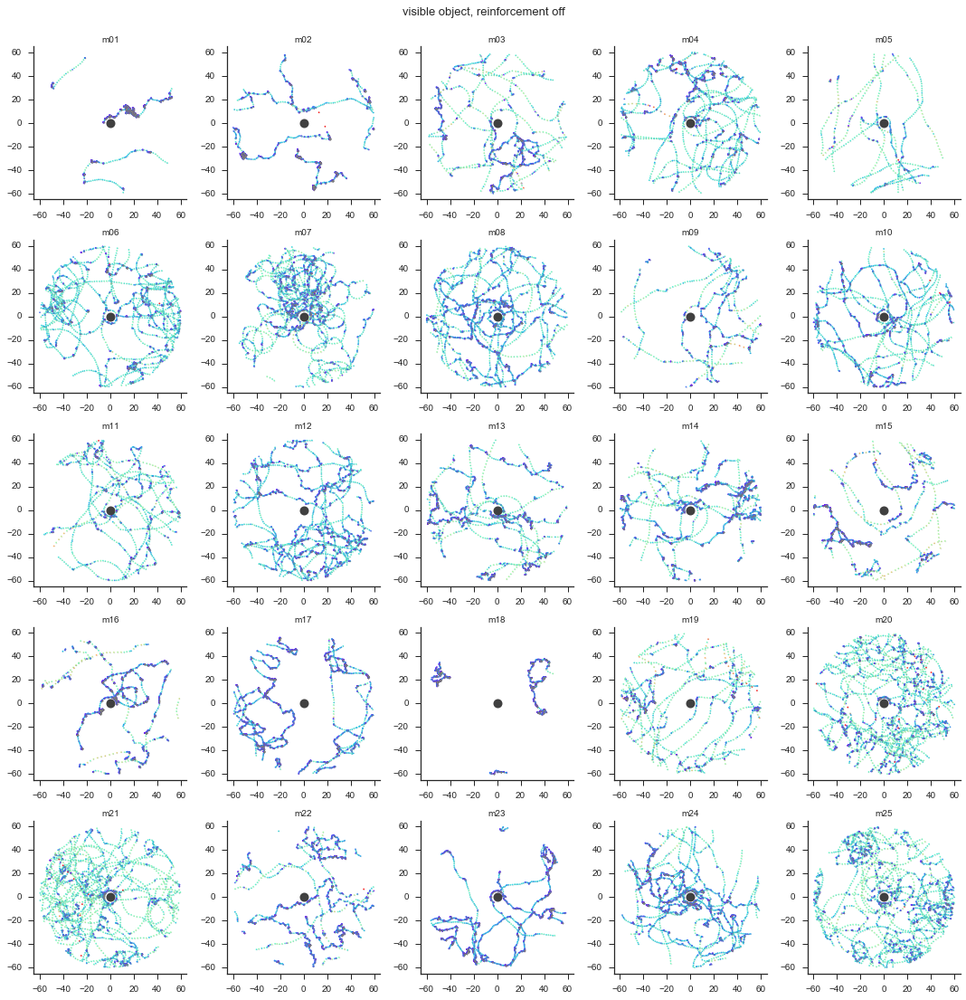

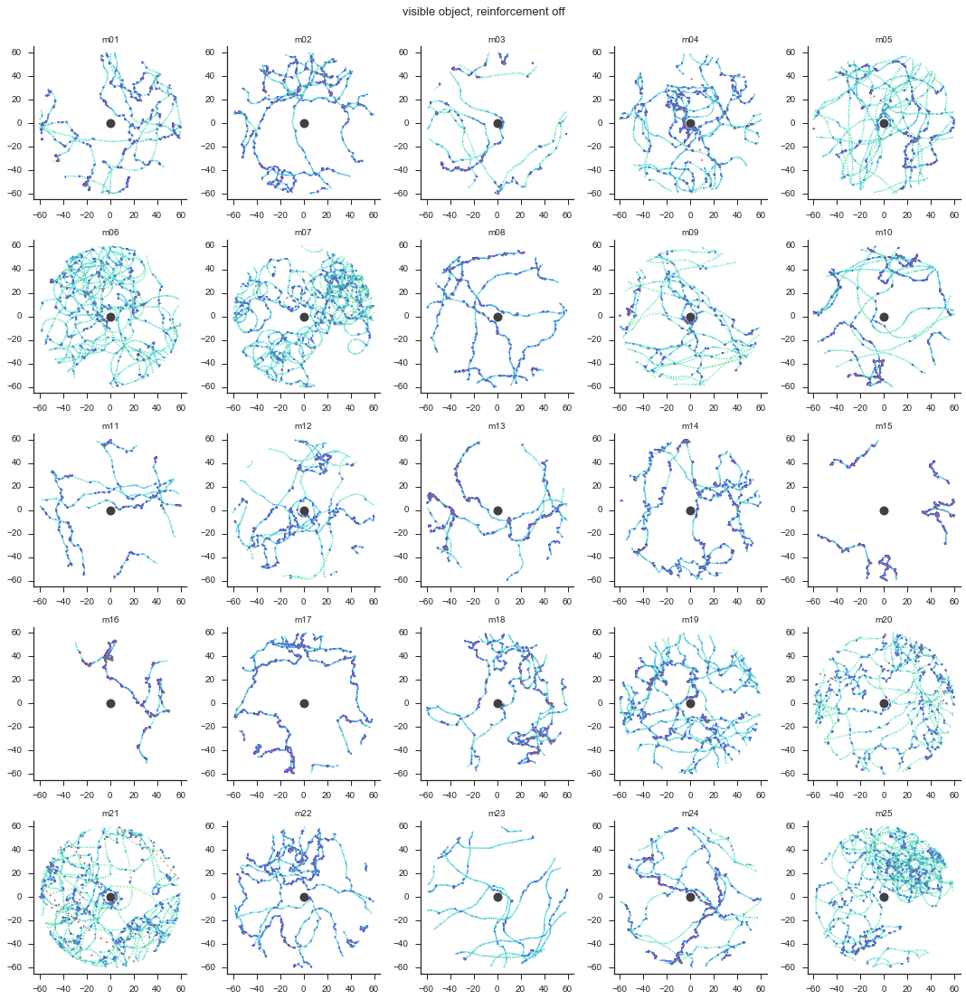

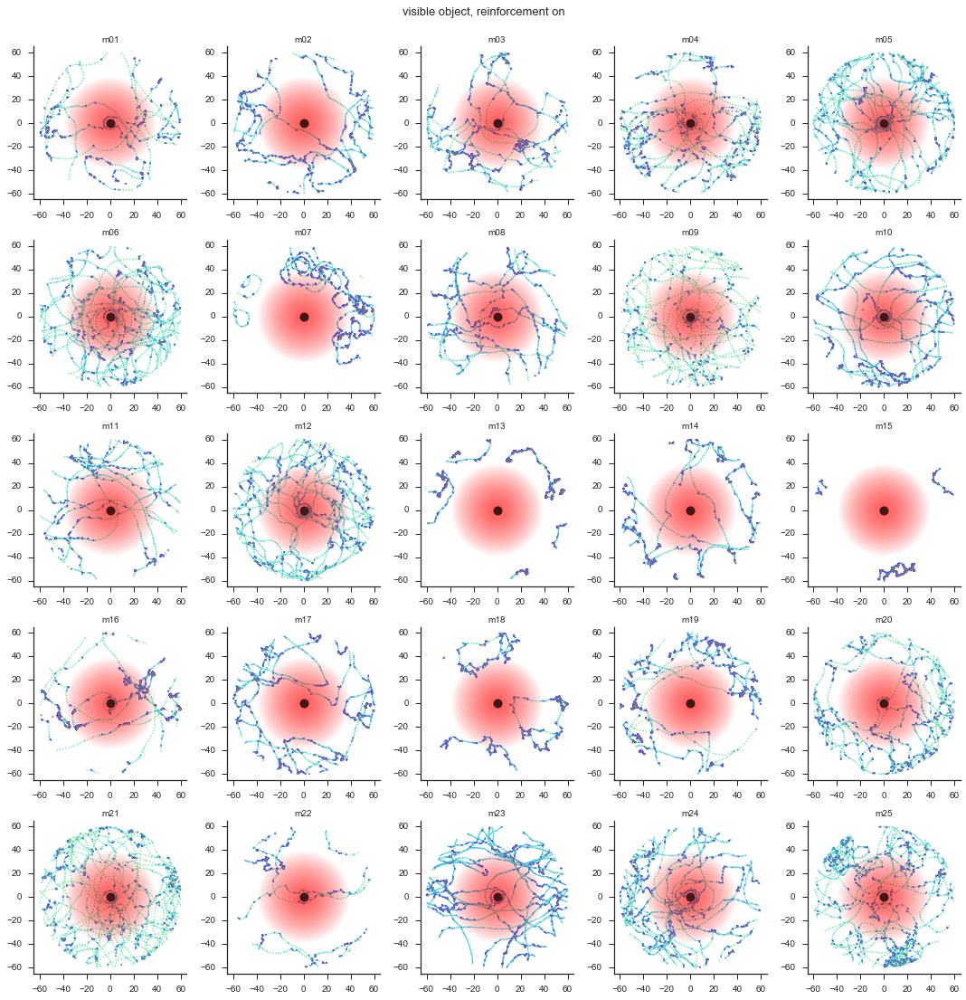

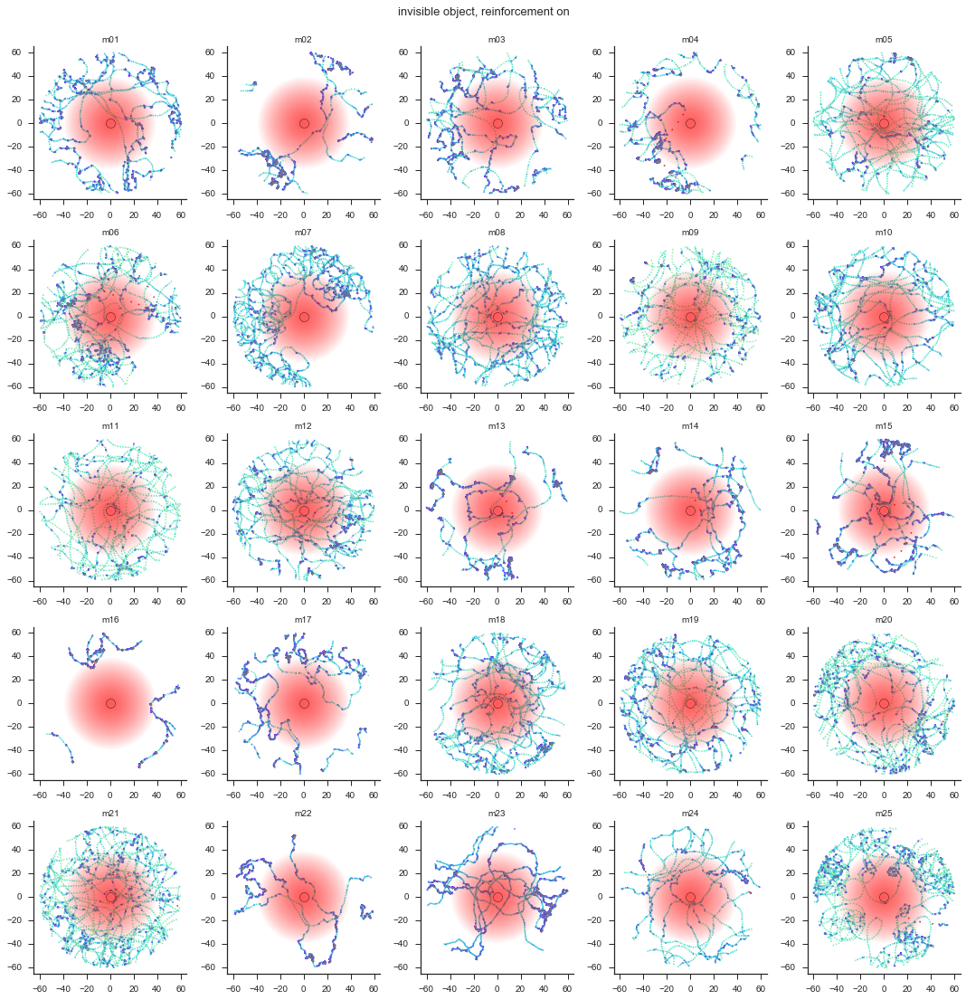

In [17]:
nrows = np.ceil(numFlies/5.0)
for ttind,trialtype in enumerate(visibilityState):
    multiflyTracePlot = plt.figure(figsize=(15,3*nrows))
    figtitle = multiflyTracePlot.suptitle(trialtype + ' object, reinforcement ' + rZoneState[ttind] ,fontsize=13,y=1.02)
    for fly in range(numFlies):
        multiflyTracePlot_sbplt = multiflyTracePlot.add_subplot(nrows,5,fly+1)
       
        querystring = '(trialtype=="' + trialtype + '") & (trial==' + str(ttind+1) + ') & (flyID =="' + flyIDs[fly] +  '")'

        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze()
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze()
        perFlyvT = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze()
        
        selectPts = range(0,len(perFlyX),3)
        #color = scalarMap.to_rgba(timecolor), alpha = 0.1)
        multiflyTracePlot_sbplt.plot(perFlyX[selectPts],perFlyY[selectPts],'.',markersize=3,color='grey',alpha=0.2)
        multiflyTracePlot_sbplt.scatter(perFlyX[selectPts],perFlyY[selectPts],s=3, c=perFlyvT[selectPts], cmap='rainbow',
                                        vmin=-1, vmax=35, edgecolor='none',alpha=0.9)
        
        if (trialtype == 'visible'):
            multiflyTracePlot_sbplt.plot(0, 0, marker='o', markersize=10, linestyle='none', alpha=0.75, color='black')
        else:
            multiflyTracePlot_sbplt.plot(0, 0, marker='o', markersize=10, alpha=0.75, markeredgewidth=0.5,
                                         markerfacecolor='None',markeredgecolor='black')

        if(rZoneState[ttind]=='on'):
            rZoneRange = float(rZone_rOuter - rZone_rInner)
            for zRad in range(rZone_rInner, rZone_rOuter):
                circle1 = plt.Circle((0, 0), zRad, color='r', alpha=1.0/rZoneRange)
                multiflyTracePlot_sbplt.add_artist(circle1)
        
        myAxisTheme(multiflyTracePlot_sbplt)
        multiflyTracePlot_sbplt.set_title(flyIDs[fly],fontsize=10)
        multiflyTracePlot_sbplt.set_aspect('equal')
        multiflyTracePlot_sbplt.set_xlim(-arenaRad-5, arenaRad + 5)
        multiflyTracePlot_sbplt.set_ylim(-arenaRad-5, arenaRad + 5)
        
    multiflyTracePlot.tight_layout()
    
    # analysisDir + 'tracePlotMA/' should already exist from single trial analysis
    # makeNestedPlotDirectory(analysisDir, 'tracePlotMA/', objecttype + sep)
    multiflyTracePlot.savefig(analysisDir +'tracePlotMA/'+ genotype +'_'+flyIDs[0][0] +'_'+ trialtype +'_rZones'+ rZoneState[ttind]
                              +'_traceVeloColored_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf', format='pdf', 
                              bbox_extra_artists=(figtitle,), bbox_inches='tight')

### Velocity and relative heading distributions

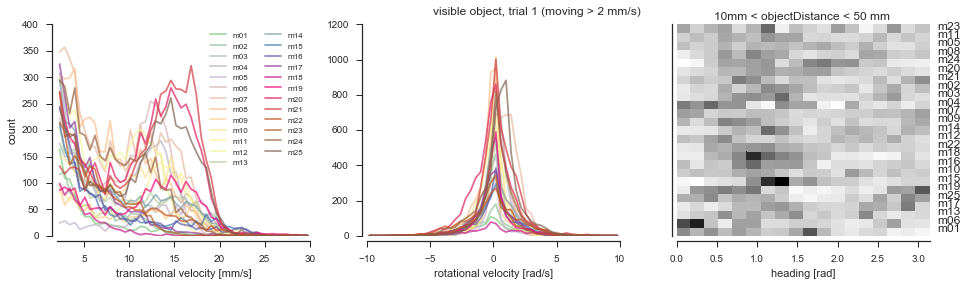

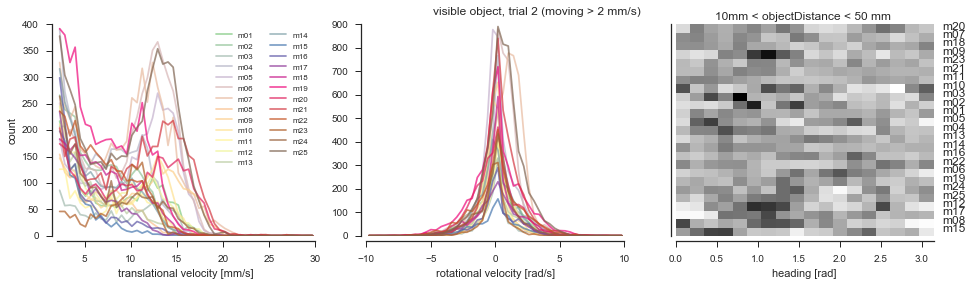

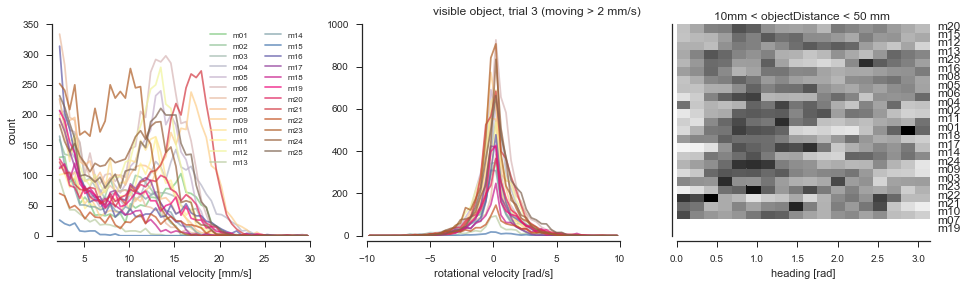

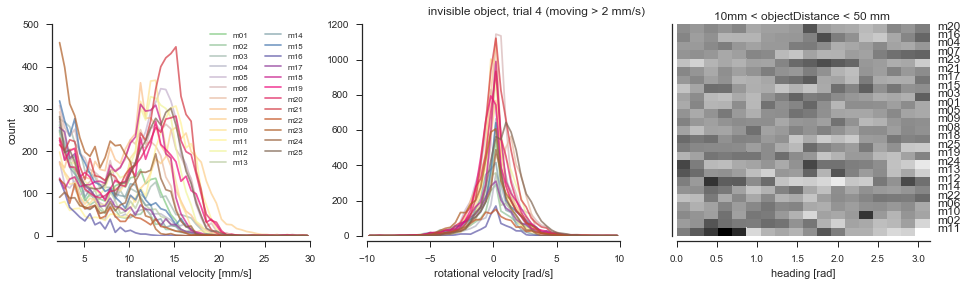

In [18]:
for ttind,trialtype in enumerate(visibilityState):
    
    veloDistFig = plotVeloHeadingDistribution_flyVR_df(FOAllFlies_df, trialtype, str(ttind+1), flyIDs, keylistLong,
                                                       vTransTH, 10, 50)
    veloDistFig.tight_layout()
    
    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

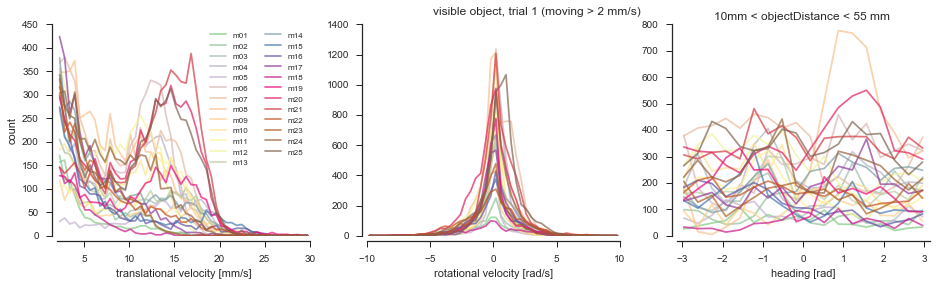

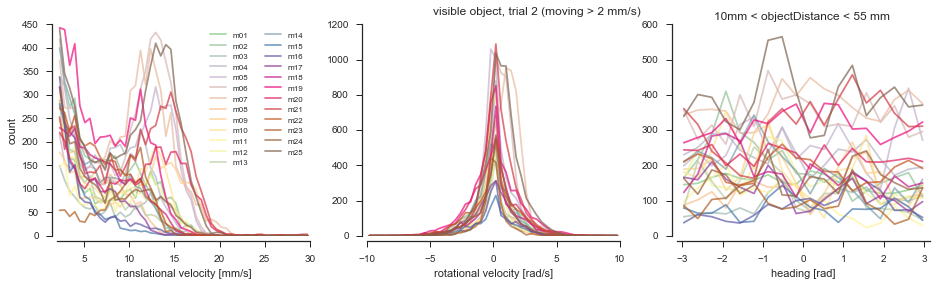

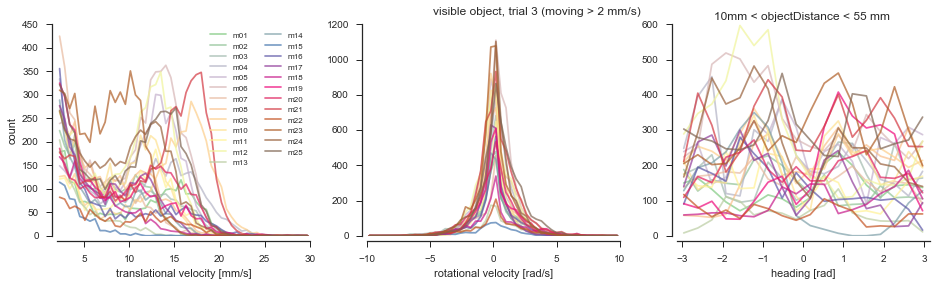

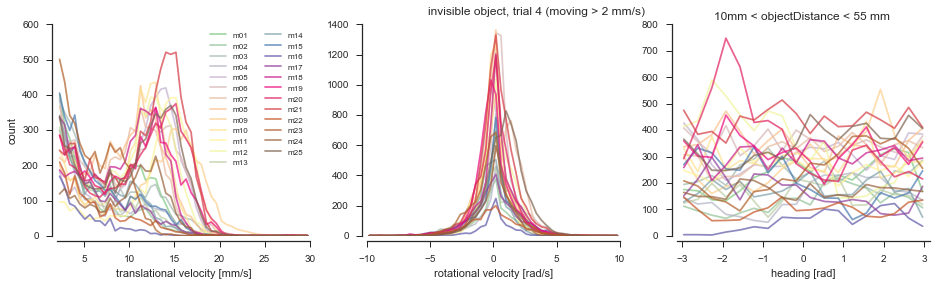

In [19]:
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df,'all',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions2_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

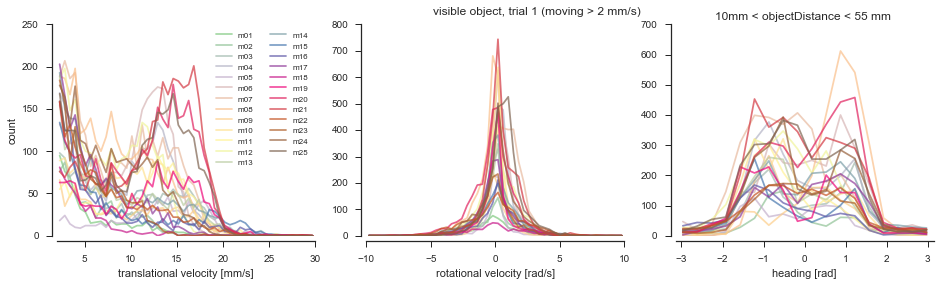

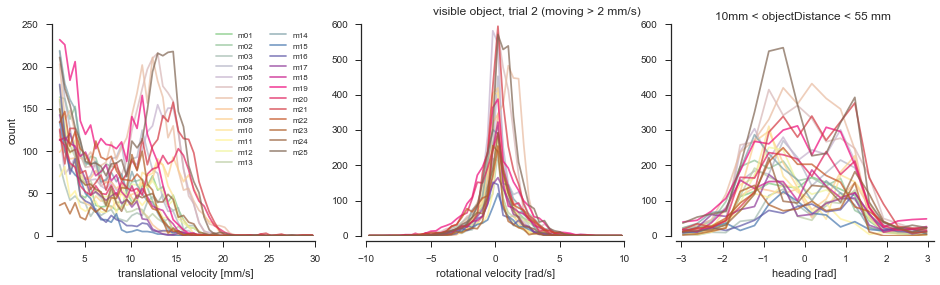

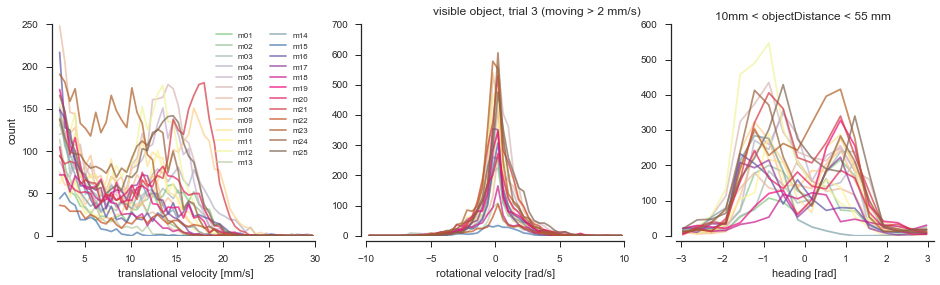

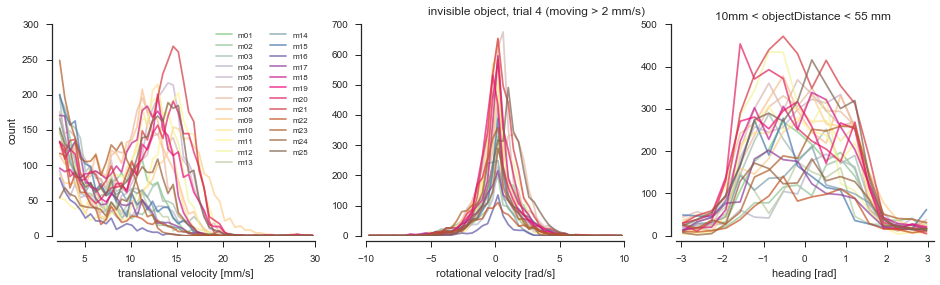

In [20]:
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df, 'approach',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions2_apr_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

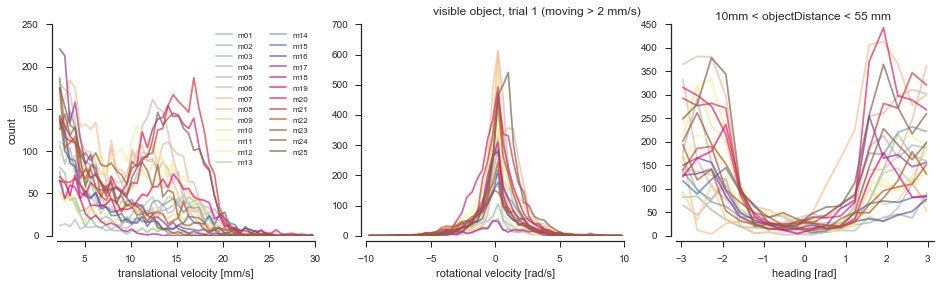

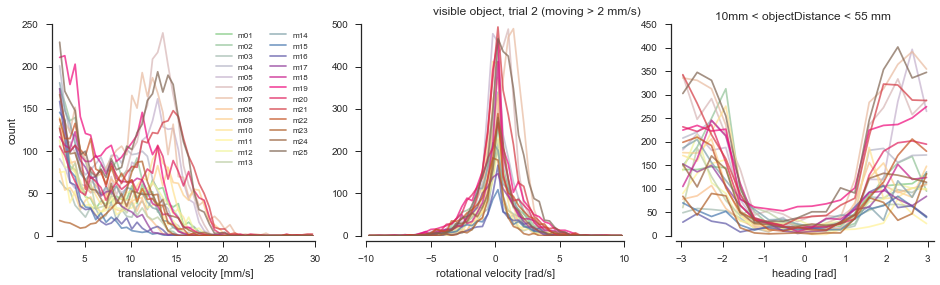

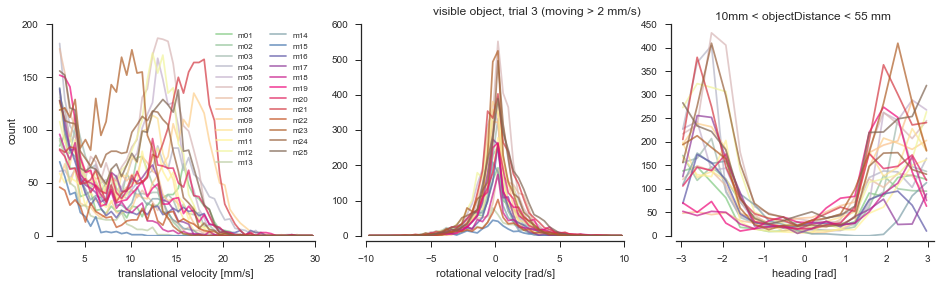

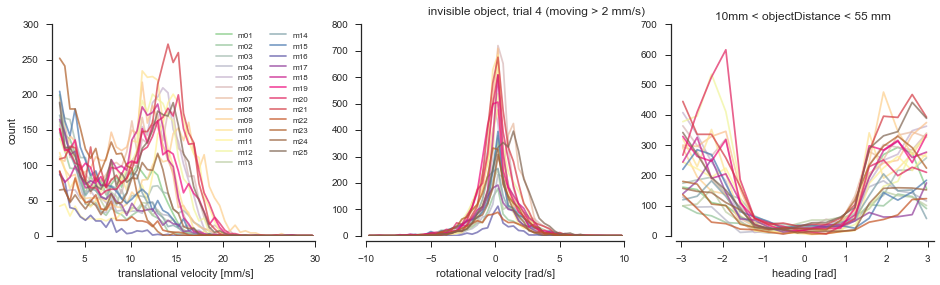

In [21]:
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df, 'departure',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions2_dep_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

## Residency

### 2D (cartesian) residency

Plot directory already exists


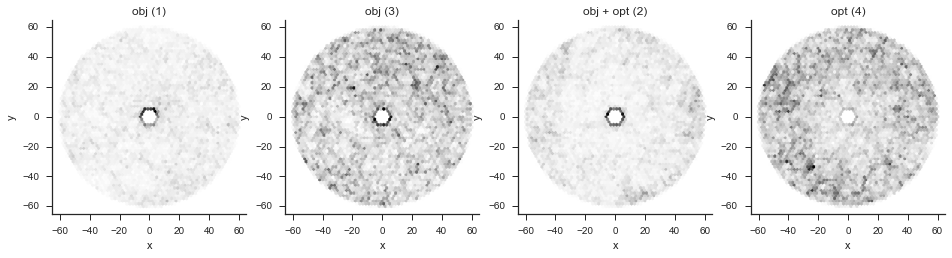

In [22]:
numBins = 60

keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_vT = keylistLong.index('transVelo')

hexplotfig = plt.figure(figsize=(16,4))
for trial, condition in enumerate(trialName):
    querystring = '(trial == ' + str(trial+1) + ') & (moving > 0)'
    xPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    ax = hexplotfig.add_subplot(1,4,trial+1)
    ax.hexbin(xPosMA, yPosMA, gridsize=numBins, cmap='Greys')
    plt.xlabel('x'); plt.ylabel('y')
    ax.set_xlim(-arenaRad-5, arenaRad+5); ax.set_ylim(-arenaRad-5, arenaRad+5)
    ax.set_title(trialName[trial])
    ax.set_aspect('equal')
    myAxisTheme(ax)

try:
    mkdir(analysisDir + 'residencyPlots/')
except:
    print('Plot directory already exists')
hexplotfig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                   +'_residencyMA_n'+ str(len(flyIDs)) +'.pdf', format='pdf')


Plot directory already exists
Plot directory already exists
Plot directory already exists
Plot directory already exists


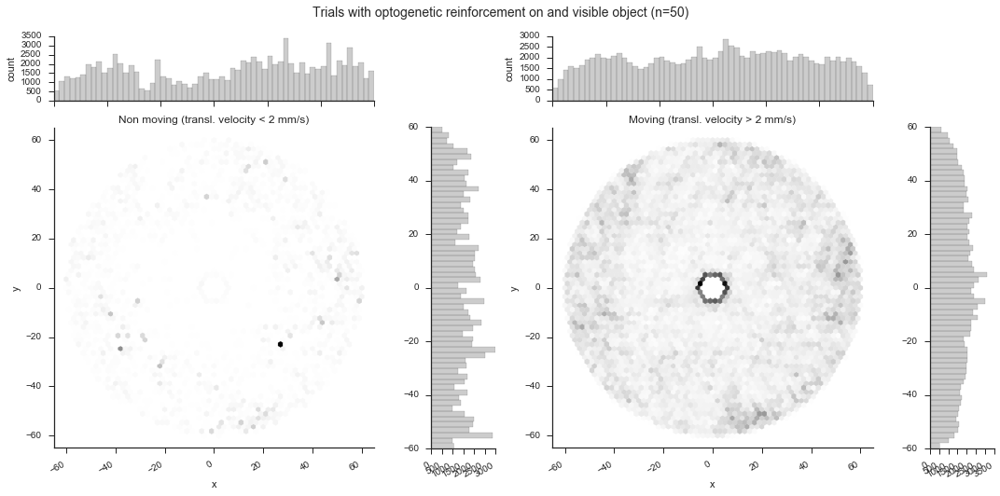

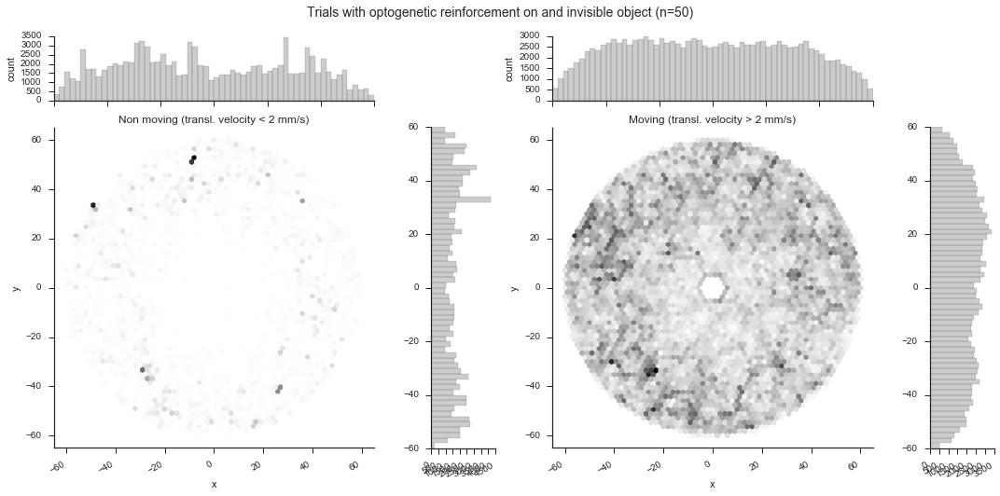

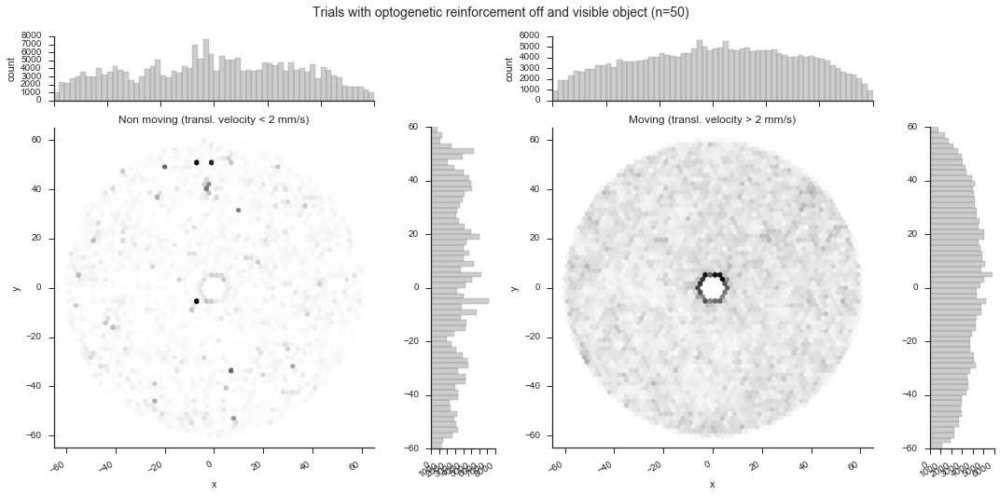

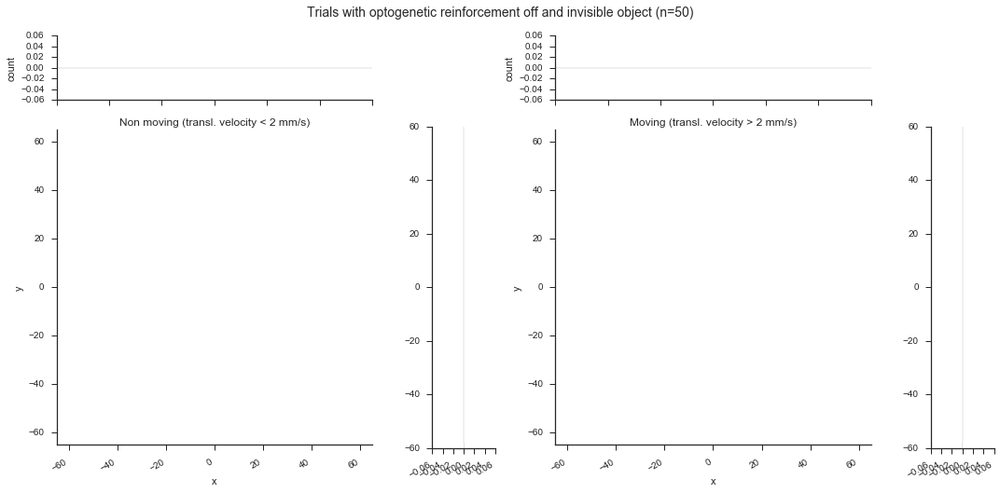

In [23]:
# make fly summary plot of residency:
numBins = 60

keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_vT = keylistLong.index('transVelo')

nTrials = (nTrialsNR,nTrialsR)

for indcond, condition in enumerate(['on','off']):
    for indcond2, condition2 in enumerate(['visible','invisible']):
        querystring = '(reinforcement == "' + condition + '") & (trialtype == "'+condition2+'")'
        try:
            xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
            yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
            movingall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1]).squeeze().astype('bool')
            vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()

            movingall = vT>vTransTH

            # make plot
            noNans = ~np.isnan(xPosMAall)
            hexplotfig = residencyWithHistograms_splitOnWalking(
                xPosMAall[noNans], yPosMAall[noNans], movingall[noNans], arenaRad, numBins, vTransTH,
                'Trials with optogenetic reinforcement ' + condition + ' and '+condition2+' object (n=' + str(nTrials[indcond]) + ')')

            try:
                mkdir(analysisDir + 'residencyPlots/')
            except:
                print('Plot directory already exists')
            hexplotfig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]+'_rZones' + condition
                     + '_'+condition2+'Object'+'_residencyMA_splitonwaling_n'+ str(len(flyIDs)) +'.pdf', format='pdf')
        except ValueError:
            print('Condition was not tested.')

### 1D (radial) residency

Plot directory already exists


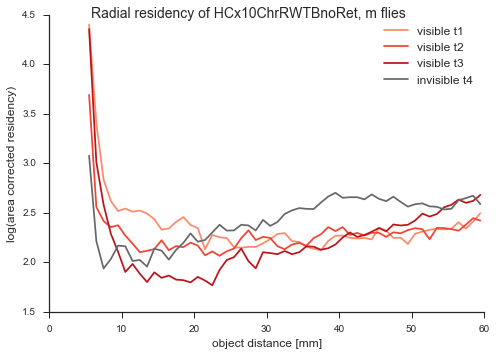

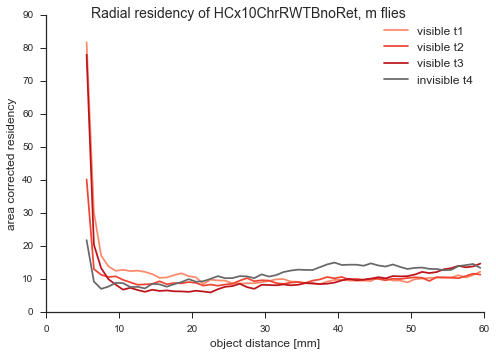

In [24]:
movementFilter = 'moving > 0'
numBins = 55
histRange = (5,arenaRad)

try:
    mkdir(analysisDir + 'residencyPlots/')
except:
    print('Plot directory already exists')

# log residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidency_df(radResPlt, FOAllFlies_df, keyind_xPos, keyind_yPos, movementFilter,
                               visibilityState, numBins, histRange,1, True)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidency_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

# linear residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidency_df(radResPlt, FOAllFlies_df, keyind_xPos, keyind_yPos, movementFilter,
                               visibilityState, numBins, histRange,1, False)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidency_lin_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

### 1D (radial) residency plot with variance measure based on single fly counts

In [25]:
def oneDimResidencyWithVar_df(radResPlt, FODataframe, flyIDs, keyind_xPos, keyind_yPos, movementFilter, visState, 
                              numBins, histRange, lineAlpha, plotLog, varstyle, fill, condLegend):

    # normalisation factor for cirle area rings
    areaNormA = np.square(np.linspace(histRange[0], histRange[1], numBins))*np.pi
    areaNorm = areaNormA[1:]-areaNormA[:-1]

    # colormap for trials (visible object trials in colour, invisible object trials in grey shades)
    numInvTrials = sum(['invisible' in visState[trial] for trial in range(len(visState))])
    numVisTrials = len(visState)-numInvTrials

    visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
    invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
    trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(numVisTrials)]
    [trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(numInvTrials)]

    #legendtext = []
    legendhand = []

    for trial, cond in enumerate(visState):
        trialRadRes = np.zeros((numFlies,numBins-1))
        for fly in range(numFlies):
            querystring = '(trialtype=="'+cond+'")&(trial=='+str(trial+1)+')&('+movementFilter\
                            +')&(flyID=="'+flyIDs[fly]+'")'

            xPosMA = np.asarray(FODataframe.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
            yPosMA = np.asarray(FODataframe.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()

            # transform trajectory to polar coordinates
            objDist, theta = cartesian2polar(xPosMA, yPosMA)

            radresidency, edges = np.histogram(objDist, bins=np.linspace(histRange[0], histRange[1], numBins))
            trialRadRes[fly,:] = radresidency/areaNorm
            
            jitterRange = 0.2*np.diff(histRange)/numBins
            
            if varstyle == 'dotplot':
                if plotLog:
                    toplot = np.log(radresidency/areaNorm)
                else:
                    toplot = radresidency/areaNorm
                
                radResPlt.plot(edges[:-1]+np.diff(edges)/2.0+np.random.uniform(-jitterRange,jitterRange), toplot,
                               color=trialCMap[trial], linestyle='none', marker='.', alpha=0.5)
        
        if plotLog:
            if varstyle == 'std':
                toplot = np.log(np.nanmean(trialRadRes,0))
                var1 = np.log(np.nanmean(trialRadRes,0) + np.nanstd(trialRadRes,0))
                var2 = np.log(np.nanmean(trialRadRes,0) - np.nanstd(trialRadRes,0))
            elif varstyle == 'iqr':
                toplot = np.log(np.nanmedian(trialRadRes,0))
                [var1,var2] = np.log(np.nanpercentile(trialRadRes,[25,75],axis=0))
            else:
                toplot = np.log(np.nanmean(trialRadRes,0))
                
        else:
            if varstyle == 'std':
                toplot = np.nanmean(trialRadRes,0)
                var1 = toplot + np.nanstd(trialRadRes,0)
                var2 = toplot - np.nanstd(trialRadRes,0)
            elif varstyle == 'iqr':
                toplot = np.nanmedian(trialRadRes,0)
                [var1,var2] = np.nanpercentile(trialRadRes,[25,75],axis=0)
            else:
                toplot = np.nanmean(trialRadRes,0)
        
        if varstyle != 'dotplot':
            lhand, = radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, toplot, color=trialCMap[trial],
                                    alpha=lineAlpha,linewidth=3)
            radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, var1,color=trialCMap[trial], alpha=lineAlpha,linewidth=1)
            radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, var2,color=trialCMap[trial], alpha=lineAlpha,linewidth=1)
            if fill:
                #radResPlt.fill_between(edges[:-1]+np.diff(edges)/2.0, np.maximum(var1,-6), np.maximum(var2,-6), color=trialCMap[trial], alpha=0.2)
                radResPlt.fill_between(edges[:-1]+np.diff(edges)/2.0, var1, var2, color=trialCMap[trial], alpha=0.2)
        else:
            lhand, = radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, toplot, color=trialCMap[trial], alpha=lineAlpha,linewidth=3)            

        legendhand.append(lhand)
        #legendtext.append(cond + ' t' + str(trial+1))

    plt.legend(legendhand,condLegend, loc='best', fontsize=12)
    radResPlt.set_xlabel('object distance [mm]', fontsize=12)
    if plotLog:
        radResPlt.set_ylabel('log(area corrected residency [count/mm^2])', fontsize=12)
    else:
        radResPlt.set_ylabel('area corrected residency [count/mm^2]', fontsize=12)

    return radResPlt

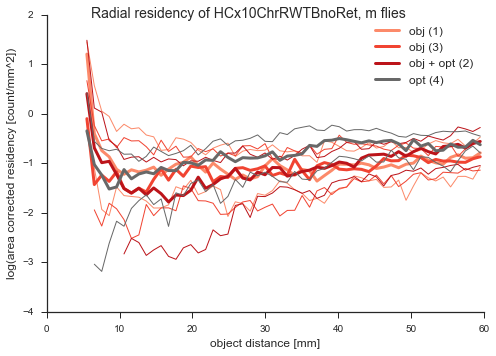

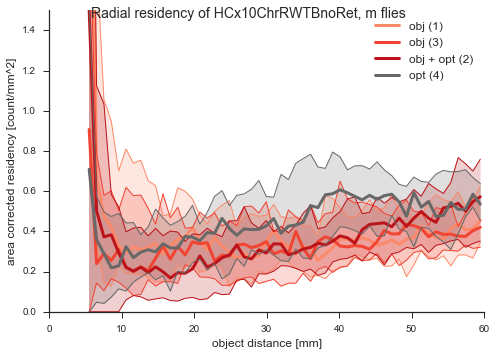

In [26]:
movementFilter = 'moving > 0'
numBins = 55
histRange = (5,arenaRad)
varStyle = 'iqr' #'std', 'iqr' 'dotplot'
fill = False

# log residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidencyWithVar_df(radResPlt, FOAllFlies_df, flyIDs, keyind_xPos, keyind_yPos, movementFilter,
                                      visibilityState, numBins, histRange, 1, True, varStyle, fill, trialName)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidencyVar_'+varStyle+'_log_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

# linear residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidencyWithVar_df(radResPlt, FOAllFlies_df, flyIDs, keyind_xPos, keyind_yPos, movementFilter,
                                      visibilityState, numBins, histRange, 1, False, varStyle, True, trialName)
myAxisTheme(radResPlt)
radResPlt.set_ylim(0,1.5)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidencyVar_'+varStyle+'_lin_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

#### Compute summary statistic: mean rel. residency at outermost 1 cm ring of optogenetic reinforcement

In [27]:
def oneDimResidencyBoxPlot_df(trial,cond,FODataframe, flyIDs, keyind_xPos, keyind_yPos, movementFilter, distRange):
    
    boxplotData = []
    
    # normalisation factor for cirle area rings
    areaNormA = np.square(distRange)*np.pi
    areaNorm = areaNormA[1]-areaNormA[0]

    for fly in range(numFlies):
        querystring = '(trialtype=="'+cond+'")&(trial=='+str(trial+1)+')&('+movementFilter\
            +')&(flyID=="'+flyIDs[fly]+'")&(objectDistance >'+str(distRange[0])+')&(objectDistance <='+str(distRange[1])+')'
                                                                                                                      
        xPosRing = np.asarray(FODataframe.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()

        try:
            boxplotData.append(len(xPosRing)/areaNorm)
        except TypeError:
            boxplotData.append(0)
            
    return boxplotData                                                                                                         

In [28]:
rZone_rOuter

40

In [29]:
# colormap for trials (visible object trials in colour, invisible object trials in grey shades)
numInvTrials = sum(['invisible' in visibilityState[trial] for trial in range(len(visibilityState))])
numVisTrials = len(visibilityState)-numInvTrials

visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(numVisTrials)]
[trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(numInvTrials)]

[None]

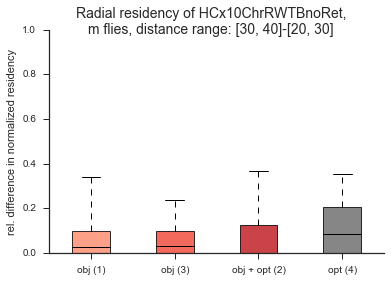

In [30]:
trials = range(4)
distRange = [rZone_rOuter-10,rZone_rOuter]
normRange = [rZone_rOuter-20,rZone_rOuter-10]
allBoxplotData = []

for trial in trials:
    boxplotDataRaw = oneDimResidencyBoxPlot_df(trial,visibilityState[trial],FOAllFlies_df,flyIDs,
                                            keyind_xPos,keyind_yPos, movementFilter, distRange)
    boxplotDataNorm = oneDimResidencyBoxPlot_df(trial,visibilityState[trial],FOAllFlies_df,flyIDs,
                                            keyind_xPos,keyind_yPos, movementFilter, normRange)
    boxplotData = np.asarray(boxplotDataRaw)-np.asarray(boxplotDataNorm)
    allBoxplotData.append(boxplotData[~np.isnan(boxplotData)])

bpFig = plt.figure(figsize=(6,4))
bpPlt = bpFig.add_subplot(1,1,1)
bp = bpPlt.boxplot(allBoxplotData,patch_artist=True)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['medians'], color='black')
plt.setp(bp['fliers'], color='black', marker='+')

for ind,box in enumerate(bp['boxes']):
    plt.setp(box, alpha=0.8,
             linewidth=1, 
             facecolor=trialCMap[ind][:-1])
    
plt.xticks(range(1,5),trialName)
bpPlt.set_ylim((0,1))
bpPlt.set_ylabel('rel. difference in normalized residency')
myAxisTheme(bpPlt)

bpFig.suptitle('Radial residency of '+genotype+',\n'+flyIDs[0][0]+' flies, distance range: '+str(distRange)+'-'+str(normRange),fontsize=14)

bpFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
              + '_radResidencyBoxplot_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

np.savetxt(analysisDir+'residencyPlots/'+genotype+'_'+flyIDs[0][0]
           +'_radResidencyBoxplotData_n'+ str(len(flyIDs)) +'.csv', allBoxplotData, delimiter=',')

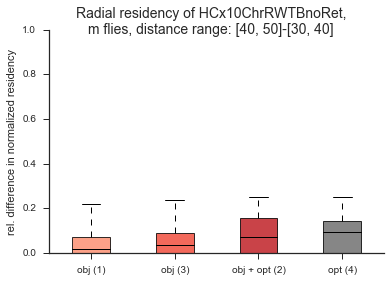

In [31]:
trials = range(4)
distRange = [rZone_rOuter,rZone_rOuter+10]
normRange = [rZone_rOuter-10,rZone_rOuter]
allBoxplotData = []

for trial in trials:
    boxplotDataRaw = oneDimResidencyBoxPlot_df(trial,visibilityState[trial],FOAllFlies_df,flyIDs,
                                            keyind_xPos,keyind_yPos, movementFilter, distRange)
    boxplotDataNorm = oneDimResidencyBoxPlot_df(trial,visibilityState[trial],FOAllFlies_df,flyIDs,
                                            keyind_xPos,keyind_yPos, movementFilter, normRange)
    boxplotData = np.asarray(boxplotDataRaw)-np.asarray(boxplotDataNorm)
    allBoxplotData.append(boxplotData[~np.isnan(boxplotData)])
    

# colormap for trials (visible object trials in colour, invisible object trials in grey shades)
numInvTrials = sum(['invisible' in visibilityState[trial] for trial in range(len(visibilityState))])
numVisTrials = len(visibilityState)-numInvTrials

visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(numVisTrials)]
[trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(numInvTrials)]

bpFig = plt.figure(figsize=(6,4))
bpPlt = bpFig.add_subplot(1,1,1)
bp = bpPlt.boxplot(allBoxplotData,patch_artist=True)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['medians'], color='black')
plt.setp(bp['fliers'], color='black', marker='+')

for ind,box in enumerate(bp['boxes']):
    plt.setp(box, alpha=0.8,
             linewidth=1, 
             facecolor=trialCMap[ind][:-1])
    
plt.xticks(range(1,5),trialName)
bpPlt.set_ylim((0,1))
bpPlt.set_ylabel('rel. difference in normalized residency')
myAxisTheme(bpPlt)

bpFig.suptitle('Radial residency of '+genotype+',\n'+flyIDs[0][0]+' flies, distance range: '+str(distRange)+'-'+str(normRange),fontsize=14)

bpFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
              + '_radResidencyBoxplot_outside_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

np.savetxt(analysisDir+'residencyPlots/'+genotype+'_'+flyIDs[0][0]
           +'_radResidencyBoxplotData_outside_n'+ str(len(flyIDs)) +'.csv', allBoxplotData, delimiter=',')

### Boxplot of residency close to object and at zone edge

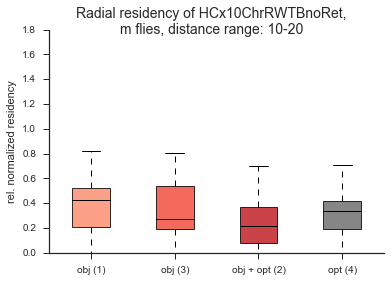

In [32]:
trials = range(4)
distRange = [10,20]
allBoxplotData = []

movementFilter = 'moving > 0'

for trial in trials:
    boxplotDataRaw = oneDimResidencyBoxPlot_df(trial,visibilityState[trial],FOAllFlies_df,flyIDs,
                                            keyind_xPos,keyind_yPos, movementFilter, distRange)
    boxplotData = np.asarray(boxplotDataRaw)
    allBoxplotData.append(boxplotData[~np.isnan(boxplotData)])
    

# colormap for trials (visible object trials in colour, invisible object trials in grey shades)
numInvTrials = sum(['invisible' in visibilityState[trial] for trial in range(len(visibilityState))])
numVisTrials = len(visibilityState)-numInvTrials

visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(numVisTrials)]
[trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(numInvTrials)]

bpFig = plt.figure(figsize=(6,4))
bpPlt = bpFig.add_subplot(1,1,1)
bp = bpPlt.boxplot(allBoxplotData,patch_artist=True)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['medians'], color='black')
plt.setp(bp['fliers'], color='black', marker='+')

for ind,box in enumerate(bp['boxes']):
    plt.setp(box, alpha=0.8, 
             linewidth=1, 
             facecolor=trialCMap[ind][:-1])
    
plt.xticks(range(1,5),trialName)
#bpPlt.set_ylim((0,1))
bpPlt.set_ylabel('rel. normalized residency')
myAxisTheme(bpPlt)

bpFig.suptitle('Radial residency of '+genotype+',\n'+flyIDs[0][0]+' flies, distance range: '+str(distRange[0])+'-'+str(distRange[1]),fontsize=14)

bpFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
              + '_radResidencyBoxplot_'+str(distRange[1])+'mmAroundLM_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

np.savetxt(analysisDir+'residencyPlots/'+genotype+'_'+flyIDs[0][0]
           +'_radResidencyBoxplotData_'+str(distRange[1])+'mmAroundLM_n'+ str(len(flyIDs)) +'.csv', allBoxplotData, delimiter=',')

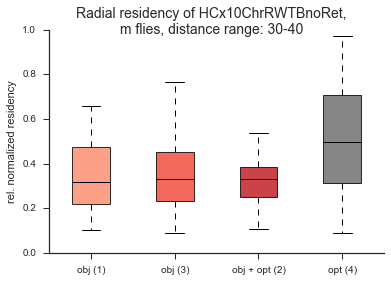

In [33]:
trials = range(4)
distRange = [rZone_rOuter-10, rZone_rOuter]
allBoxplotData = []

movementFilter = 'moving > 0'

for trial in trials:
    boxplotDataRaw = oneDimResidencyBoxPlot_df(trial,visibilityState[trial],FOAllFlies_df,flyIDs,
                                            keyind_xPos,keyind_yPos, movementFilter, distRange)
    boxplotData = np.asarray(boxplotDataRaw)
    allBoxplotData.append(boxplotData[~np.isnan(boxplotData)])

bpFig = plt.figure(figsize=(6,4))
bpPlt = bpFig.add_subplot(1,1,1)
bp = bpPlt.boxplot(allBoxplotData,patch_artist=True)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['medians'], color='black')
plt.setp(bp['fliers'], color='black', marker='+')

for ind,box in enumerate(bp['boxes']):
    plt.setp(box, alpha=0.8, 
             linewidth=1, 
             facecolor=trialCMap[ind][:-1])
    
plt.xticks(range(1,5),trialName)
#bpPlt.set_ylim((0,1))
bpPlt.set_ylabel('rel. normalized residency')
myAxisTheme(bpPlt)

bpFig.suptitle('Radial residency of '+genotype+',\n'+flyIDs[0][0]+' flies, distance range: '+str(distRange[0])+'-'+str(distRange[1]),fontsize=14)

bpFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
              + '_radResidencyBoxplot_'+str(rZone_rOuter-distRange[0])+'mmfromEdge_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

np.savetxt(analysisDir+'residencyPlots/'+genotype+'_'+flyIDs[0][0]
           +'_radResidencyBoxplotData_'+str(rZone_rOuter-distRange[0])+'mmfromEdge_n'+ str(len(flyIDs)) +'.csv', allBoxplotData, delimiter=',')

## Count number of visits (enter radius around landmark)

In [34]:
def countVisits_df(visitRad,fly,trial,allFlies_df,keyind_xPos,keyind_yPos,keyind_gam):
    
    querystring = '(trial==' + str(trial) + ') & (flyID == "'+flyIDs[fly]+'")'
    xPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()
    gammaTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_gam:keyind_gam+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    inside = (objDistTrial<visitRad).astype('int')
    time = np.linspace(0,600,len(xPosTrial))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    if len(entryTime) != len(exitTime):
        visitT = exitTime[0:min(sum(exits),sum(entries))] - entryTime[0:min(sum(exits),sum(entries))]
    else:
        visitT = exitTime - entryTime
    
    return entries, exits, visitT

In [35]:
def visitTime_df(visitRad,fly,trial,allFlies_df,keyind_xPos,keyind_yPos):
    
    querystring = '(trial==' + str(trial) + ') & (flyID == "'+flyIDs[fly]+'")'
    xPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    inside = (objDistTrial<visitRad).astype('int')
    time = np.linspace(0,600,len(xPosTrial))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    
    return entries, exits, time, entryTime, exitTime

/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:22: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)


Analysis directory already exists.


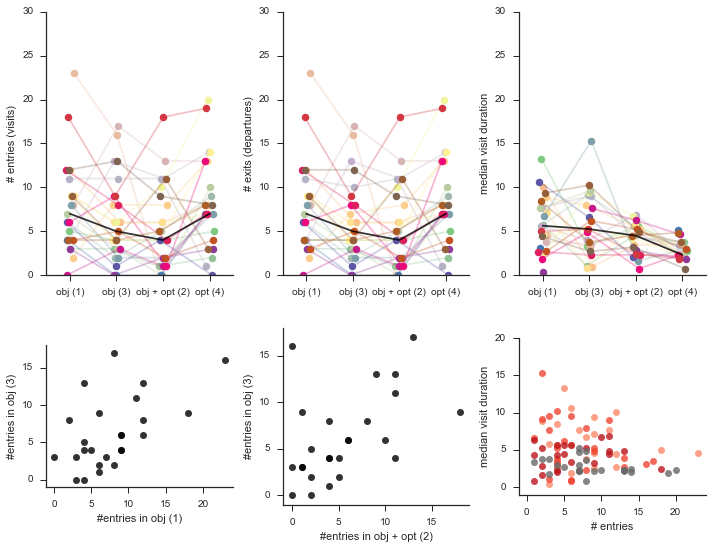

In [36]:
visitRad = 20
numtrials = 4

entriesYlim = 30

numEntries = np.zeros((numFlies,numtrials))
numExits = np.zeros((numFlies,numtrials))
lengthVisit = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

visitFig = plt.figure(figsize=(10,8))

numEntryPlt = visitFig.add_subplot(231)
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
numExitPlt = visitFig.add_subplot(232)
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
meanVisitPlt = visitFig.add_subplot(233)
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        entries, exits, visitDuration = countVisits_df(visitRad,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
        numEntry = sum(entries)
        numExit = sum(exits)
        
        numEntries[fly,trial] = numEntry
        numExits[fly,trial] = numExit
        lengthVisit[fly,trial] = np.nanmedian(visitDuration)

        numEntryPlt.plot(trial+1+tJitter,numEntry,'.',markersize=15,color=flyCMap.to_rgba(fly))
        numExitPlt.plot(trial+1+tJitter,numExit,'.',markersize=15,color=flyCMap.to_rgba(fly))
        meanVisitPlt.plot(trial+1+tJitter,np.nanmedian(visitDuration),'.',markersize=15,color=flyCMap.to_rgba(fly))
        
    numEntryPlt.plot(range(1,numtrials+1)+jitter[fly,:],numEntries[fly,:],
                     '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    numExitPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,numExits[fly,:],'-',
                    markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    meanVisitPlt.plot(range(1,numtrials+1)+jitter[fly,:],lengthVisit[fly,:],'-',
                      markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)

#plot average response
numEntryPlt.plot(range(1,5),np.nanmedian(numEntries,axis=0),color='k',alpha=0.8)
numExitPlt.plot(range(1,5),np.nanmedian(numExits,axis=0),color='k',alpha=0.8)
meanVisitPlt.plot(range(1,5),np.nanmedian(lengthVisit,axis=0),color='k',alpha=0.8)

numEntryPlt.set_ylabel('# entries (visits)')
numEntryPlt.set_ylim(0,entriesYlim)
numEntryPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numEntryPlt)

numExitPlt.set_ylabel('# exits (departures)')
numExitPlt.set_ylim(0,entriesYlim)
numExitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numExitPlt)

meanVisitPlt.set_ylabel('median visit duration')
meanVisitPlt.set_ylim(0,entriesYlim)
meanVisitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(meanVisitPlt)

#correlations
prepostPlt = visitFig.add_subplot(234)
prepostPlt.plot(numEntries[:,0],numEntries[:,1],'o', color='k',alpha=0.8)
prepostPlt.set_xlim(-1,np.max(numEntries[:,0])+1)
prepostPlt.set_ylim(-1,np.max(numEntries[:,1])+1)
prepostPlt.set_aspect('equal')
prepostPlt.set_xlabel('#entries in ' + trialName[0]); prepostPlt.set_ylabel('#entries in ' + trialName[1])
myAxisTheme(prepostPlt)

trainpostPlt = visitFig.add_subplot(235)
trainpostPlt.plot(numEntries[:,2],numEntries[:,1],'o', color='k',alpha=0.8)
trainpostPlt.set_xlim(-1,max(15, np.max(numEntries[:,2])+1))
trainpostPlt.set_ylim(-1,np.max(numEntries[:,1])+1)
trainpostPlt.set_aspect('equal')
trainpostPlt.set_xlabel('#entries in ' + trialName[2]); trainpostPlt.set_ylabel('#entries in ' + trialName[1])
myAxisTheme(trainpostPlt)

entryLengthPlt = visitFig.add_subplot(236)
visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=3), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=1), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(3)]
[trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(1)]

for trial in range(4):
    entryLengthPlt.plot(numEntries[:,trial],lengthVisit[:,trial],'o', color=trialCMap[trial],alpha=0.8)

entryLengthPlt.set_xlim(-1,np.max(numEntries)+1)
entryLengthPlt.set_ylim(-1,20)
entryLengthPlt.set_xlabel('# entries')
entryLengthPlt.set_ylabel('median visit duration')
entryLengthPlt.set_aspect('equal')
myAxisTheme(entryLengthPlt)

visitFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'visitAnalysis' + sep)
except OSError:
    print('Analysis directory already exists.')

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotype
                   + '_visitsInRad'+str(visitRad)+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

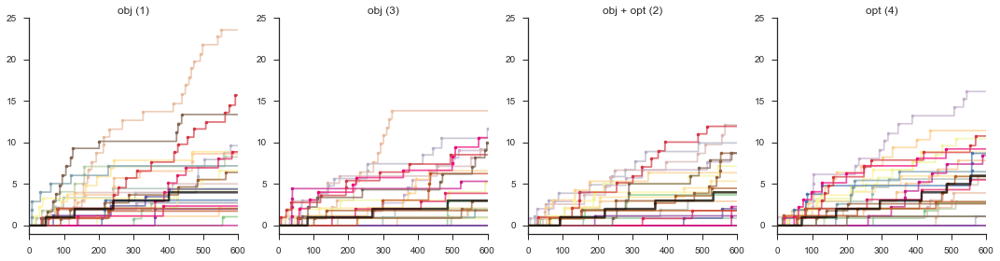

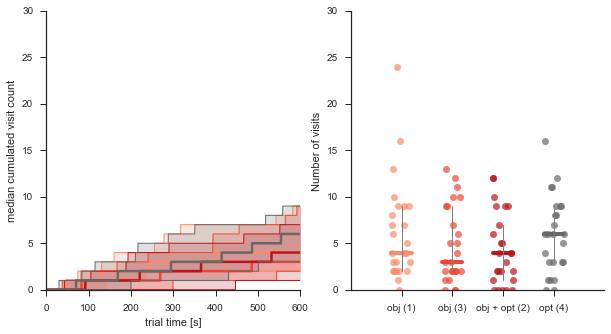

In [37]:
visitRad = 15
numtrials = 4
ymaxval = 30

visitFig = plt.figure(figsize=(15,4))
visitSummaryFig = plt.figure(figsize=(10,5))
visitSummaryPlt = visitSummaryFig.add_subplot(1,2,1)
totalVisitsPlt = visitSummaryFig.add_subplot(1,2,2)

maxVisit = 0
for trial in range(1,5):
    cumVisitPlt = visitFig.add_subplot(1,4,trial)
    
    allEntries = np.nan*np.ones((numFlies,10*60*20))
    
    # plot with individual traces
    for fly in range(numFlies):
        entries, exits, time, entryTime, exitTime = visitTime_df(visitRad,fly,trial,FOAllFlies_df,keyind_xPos,keyind_yPos)
        entriesCS = np.cumsum(entries + entries*np.random.uniform(-0.2, 0.2,len(entries)))
        cumVisitPlt.plot(time,entriesCS,color=flyCMap.to_rgba(fly),alpha=0.7)
        cumVisitPlt.plot(time[entries>0],entriesCS[entries>0],color=flyCMap.to_rgba(fly),marker='.',linestyle='none')
        maxVisit = max(maxVisit,sum(entries))
        
        allEntries[fly,:] = np.cumsum(entries[:10*60*20])  
    
    try:
        cumVisitPlt.plot(time,np.nanmedian(allEntries,axis=0),color='k',alpha=0.7,linewidth=2.5)
        #cumVisitPlt.plot(time,allEntries/(numFlies*np.ones(len(time))),color='k',alpha=0.7,linewidth=2.5)
    except:
        print('not enought data')
    cumVisitPlt.set_ylim(-1,min(ymaxval,maxVisit+1))
    cumVisitPlt.set_title(trialName[trial-1])
    myAxisTheme(cumVisitPlt)
    
    # summary plot
    visitSummaryPlt.plot(time, np.nanmedian(allEntries,axis=0),color=trialCMap[trial-1],alpha=1,linewidth=2.5) 
    [var1,var2] = np.nanpercentile(allEntries,[25,75],axis=0)
    visitSummaryPlt.plot(time, var1,color=trialCMap[trial-1],alpha=1,linewidth=1)
    visitSummaryPlt.plot(time, var2,color=trialCMap[trial-1],alpha=1,linewidth=1)
    visitSummaryPlt.fill_between(time, var1, var2, color=trialCMap[trial-1], alpha=0.2)
    
    # add scatterplot + median + iqr of total number of visits
    jittersize = 0.2
    y = allEntries[:,-1]
    x = trial + np.random.uniform(-jittersize,jittersize,size=len(y))
    
    totalVisitsPlt.plot(x,y,color=trialCMap[trial-1], marker='o', linestyle='none', alpha=0.7)
    totalVisitsPlt.plot([trial-jittersize,trial+jittersize], [np.nanmedian(y),np.nanmedian(y)], color=trialCMap[trial-1], linewidth=4)
    totalVisitsPlt.plot([trial,trial], np.nanpercentile(y,[25,75]), color='grey', linewidth=1)
    
    plt.xticks(range(1,5),trialName)
    

visitFig.tight_layout() 
visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotype
                 + '_visitsInRad'+str(visitRad)+'_cumVisitPlt_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

visitSummaryPlt.set_xlabel('trial time [s]')
visitSummaryPlt.set_ylabel('median cumulated visit count')
visitSummaryPlt.set_ylim((0,30))
myAxisTheme(visitSummaryPlt)
    
totalVisitsPlt.set_xlim((0,trial+1))
totalVisitsPlt.set_ylim((0,30))
totalVisitsPlt.set_ylabel('Number of visits')
myAxisTheme(totalVisitsPlt)


visitSummaryFig.savefig(analysisDir + 'visitAnalysis/'  + genotype
                   + '_visitsInRad'+str(visitRad)+'_cumVisitSummaryPlt_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Encounter with reinforcement zone (example)

In [38]:
def plotResponseInZone(fly, trial, tSt, tEnd,maxEv,sizeScale):

    querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'

    perFlyRVal = FOAllFlies_df.query(querystring).iloc[:,keyind_event:keyind_event+1].squeeze().astype('float').values
    perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
    perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
    perFlyGamma = FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1].squeeze().astype('float').values

    time = np.linspace(0,600,len(perFlyTra))

    encounterFig = plt.figure(figsize=(15,10))
    gs = gridspec.GridSpec(4,2 ,width_ratios=[1,0.2])
    
    npts = len(perFlyRVal[tSt:tEnd])

    evplot = encounterFig.add_subplot(gs[0,0])
    evplot.plot(time[tSt:tEnd],perFlyRVal[tSt:tEnd],'k',alpha=0.5)
    evplot.scatter(time[tSt:tEnd],perFlyRVal[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    evplot.set_ylabel('light stimulation level [%]')
    evplot.set_xlim(time[tSt],time[tEnd])
    myAxisTheme(evplot)

    tvplot = encounterFig.add_subplot(gs[1,0])
    tvplot.plot(time[tSt:tEnd],perFlyTra[tSt:tEnd],'k',alpha=0.5)
    tvplot.scatter(time[tSt:tEnd],perFlyTra[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    tvplot.set_ylim(0,40)
    tvplot.set_xlim(time[tSt],time[tEnd])
    tvplot.set_ylabel('transl. velocity [mm/s]')
    myAxisTheme(tvplot)

    rvplot = encounterFig.add_subplot(gs[2,0])
    rvplot.plot(time[tSt:tEnd],perFlyRot[tSt:tEnd],'k',alpha=0.5)
    rvplot.scatter(time[tSt:tEnd],perFlyRot[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    rvplot.set_ylim(-6,6)
    rvplot.set_xlim(time[tSt],time[tEnd])
    rvplot.set_ylabel('rot. velocity [deg/s]')
    myAxisTheme(rvplot)

    rhplot = encounterFig.add_subplot(gs[3,0])
    rhplot.plot(time[tSt:tEnd],perFlyGamma[tSt:tEnd],'k',alpha=0.5)
    rhplot.scatter(time[tSt:tEnd],perFlyGamma[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    rhplot.set_ylim(0,np.pi)
    rhplot.set_xlim(time[tSt],time[tEnd])
    rhplot.set_ylabel('rel. heading [rad]')
    myAxisTheme(rhplot)

    evplot = encounterFig.add_subplot(gs[1,1])
    evplot.plot(perFlyRVal,perFlyTra,'k.',alpha=0.8)
    evplot.set_ylim(0,40)
    myAxisTheme(evplot)

    evplot = encounterFig.add_subplot(gs[2,1])
    evplot.plot(perFlyRVal,perFlyRot,'k.',alpha=0.8)
    evplot.set_ylim(-6,6)
    myAxisTheme(evplot)

    evplot = encounterFig.add_subplot(gs[3,1])
    evplot.plot(perFlyRVal,perFlyGamma,'k.',alpha=0.8)
    evplot.set_ylim(0,np.pi)
    evplot.set_xlabel('red LED [%]')
    myAxisTheme(evplot)
    
    return encounterFig

In [39]:
rZone_max

30

Analysis directory already exists.


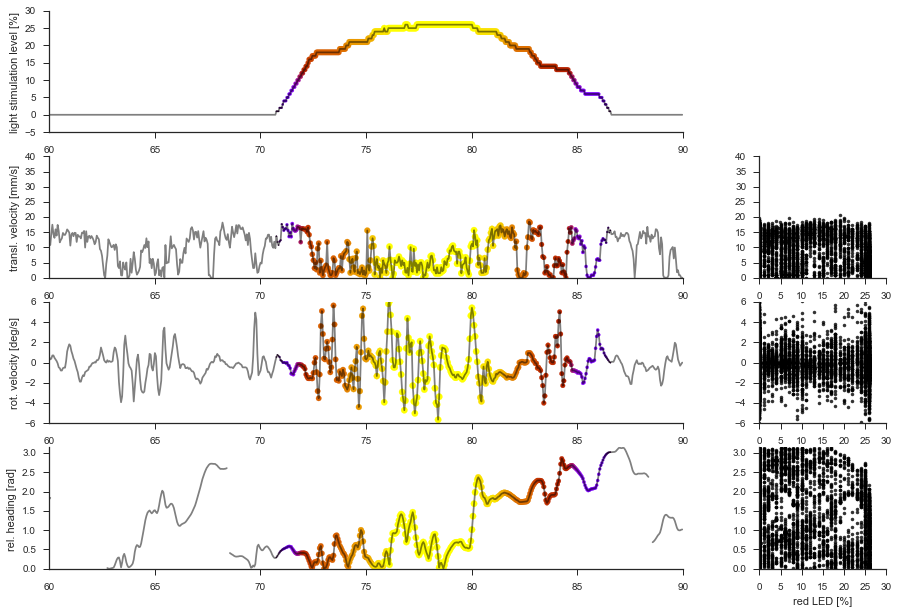

In [40]:
fly = 4
trial = 2

tSt = 20*60
tEnd = tSt+ 20*30

maxEv = rZone_max-5
sizeScale = 40.0/maxEv

encounterFig = plotResponseInZone(fly, trial, tSt, tEnd,maxEv,sizeScale)

try:
    mkdir(analysisDir + sep + 'reinforcementEffect' + sep)
except OSError:
    print('Analysis directory already exists.')

encounterFig.savefig(analysisDir + 'reinforcementEffect'+ sep + genotype + '_fly' + str(fly) + '_trial' + str(trial)
                   + 'ResponseInZone_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

Analysis directory already exists.


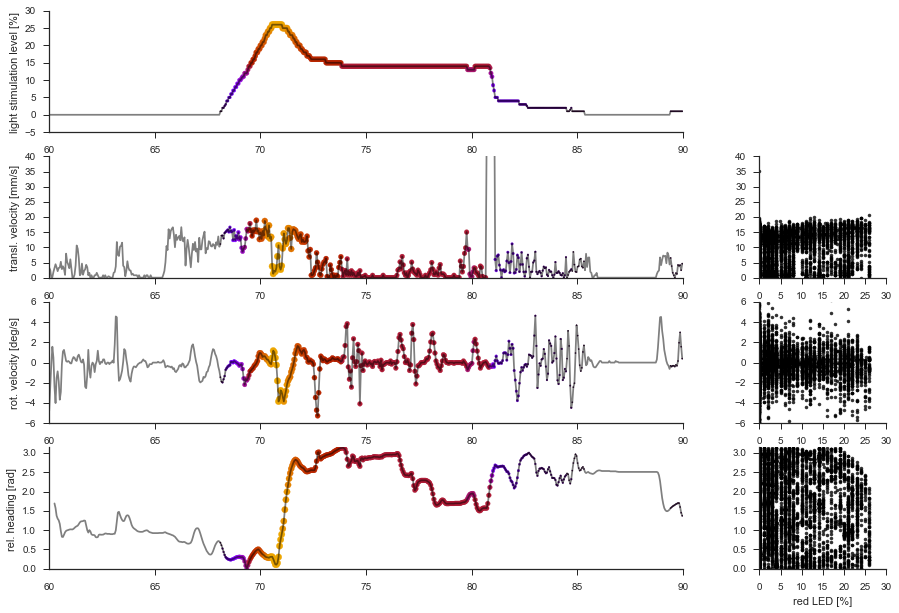

In [41]:
fly = 4
trial = 3

tSt = 20*60
tEnd = tSt+ 20*30

maxEv = rZone_max

encounterFig = plotResponseInZone(fly, trial, tSt, tEnd,maxEv,sizeScale)

try:
    mkdir(analysisDir + sep + 'reinforcementEffect' + sep)
except OSError:
    print('Analysis directory already exists.')

encounterFig.savefig(analysisDir + 'reinforcementEffect'+ sep + genotype + '_fly' + str(fly) + '_trial' + str(trial)
                   + 'ResponseInZone_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

R value: 0.0928
p value: 0.0
R value: 0.0177
p value: 0.0


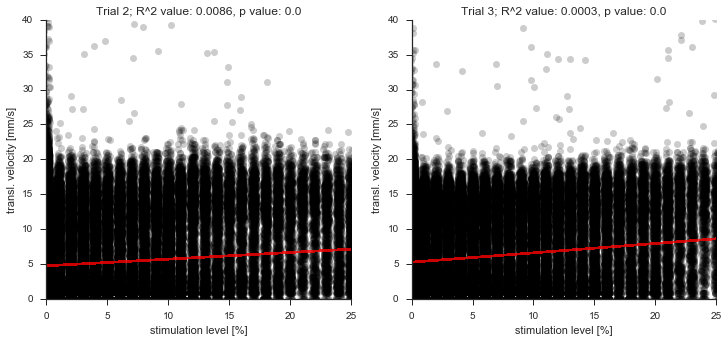

In [42]:
from scipy import stats

corrFig = plt.figure(figsize=(12,5))

trial = 2

querystring = '(trial == ' + str(trial+1) + ')'
perFlyRVal = FOAllFlies_df.query(querystring).iloc[:,keyind_event:keyind_event+1].squeeze().astype('float').values

perFlyRVal = perFlyRVal+np.random.uniform(-0.25, 0.25,np.size(perFlyRVal))

querystring = '(trial == ' + str(trial+1) + ')'
perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
perFlyGamma = FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1].squeeze().astype('float').values

slope, intercept, r_value, p_value, std_err = stats.linregress(perFlyRVal,perFlyTra)

print('R value: '+str(round(r_value,4)))
print('p value: '+str(round(p_value,4)))

trial2plt = corrFig.add_subplot(121)
trial2plt.set_title('Trial 2; R^2 value: '+str(round(r_value**2,4))+', p value: '+str(round(p_value,2)))
trial2plt.plot(perFlyRVal,perFlyTra,'ko', alpha=0.2)
trial2plt.plot(perFlyRVal,perFlyRVal*slope+intercept,'r-', alpha=0.8)
trial2plt.set_xlim(0,25)
trial2plt.set_ylim(0,40)
trial2plt.set_xlabel('stimulation level [%]')
trial2plt.set_ylabel('transl. velocity [mm/s]')
myAxisTheme(trial2plt)


trial = 3

querystring = '(trial == ' + str(trial+1) + ')'
perFlyRVal = FOAllFlies_df.query(querystring).iloc[:,keyind_event:keyind_event+1].squeeze().astype('float').values

perFlyRVal = perFlyRVal+np.random.uniform(-0.25, 0.25,np.size(perFlyRVal))

querystring = '(trial == ' + str(trial+1) + ')'
perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
perFlyGamma = FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1].squeeze().astype('float').values

slope, intercept, r_value, p_value, std_err = stats.linregress(perFlyRVal,perFlyTra)

print('R value: '+str(round(r_value,4)))
print('p value: '+str(round(p_value,4)))

trial3plt = corrFig.add_subplot(122)
trial3plt.set_title('Trial 3; R^2 value: '+str(round(r_value**2,4))+', p value: '+str(round(p_value,2)))
trial3plt.plot(perFlyRVal,perFlyTra,'ko', alpha=0.2)
trial3plt.plot(perFlyRVal,perFlyRVal*slope+intercept,'r-', alpha=0.8)
trial3plt.set_xlim(0,25)
trial3plt.set_ylim(0,40)
trial3plt.set_xlabel('stimulation level [%]')
trial3plt.set_ylabel('transl. velocity [mm/s]')
myAxisTheme(trial3plt)

corrFig.savefig(analysisDir + 'reinforcementEffect'+ sep + genotype
                + '_correlation_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

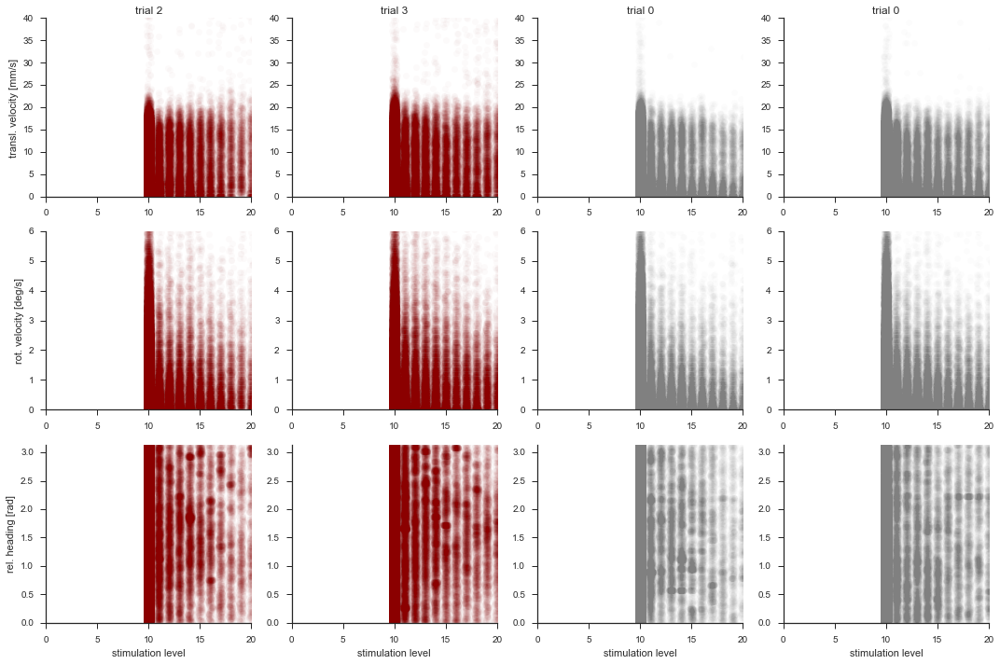

In [48]:
trialList = [2,3,0,0]
eventTList = [2,3,2,3]
tCol = ['darkred','darkred','grey','grey']
aval = 0.02

maxStimLevel = rZone_max-10

encounterFig = plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(3,len(trialList)) #,width_ratios=[1,1])

for tInd in range(len(trialList)):
    trial = trialList[tInd]
    
    querystring = '(trial == ' + str(eventTList[tInd]+1) + ')'
    perFlyRVal = FOAllFlies_df.query(querystring).iloc[:,keyind_event:keyind_event+1].squeeze().astype('float').values
    
    perFlyRVal = perFlyRVal+np.random.uniform(-0.25, 0.25,np.size(perFlyRVal))
    
    querystring = '(trial == ' + str(trial+1) + ')'
    perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
    perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
    perFlyGamma = FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1].squeeze().astype('float').values

    try:
        tvplot = encounterFig.add_subplot(gs[0,tInd])
        tvplot.plot(perFlyRVal,perFlyTra,'o',color=tCol[tInd], alpha=aval)
        tvplot.set_ylim(0,40)
        tvplot.set_xlim(0,maxStimLevel)
        tvplot.set_title('trial '+ str(trialList[tInd]))
        myAxisTheme(tvplot)

        rvplot = encounterFig.add_subplot(gs[1,tInd])
        rvplot.plot(perFlyRVal,abs(perFlyRot),'o',color=tCol[tInd], alpha=aval)
        rvplot.set_ylim(0,6)
        rvplot.set_xlim(0,maxStimLevel)
        myAxisTheme(rvplot)

        rhplot = encounterFig.add_subplot(gs[2,tInd])
        rhplot.plot(perFlyRVal,perFlyGamma,'o',color=tCol[tInd], alpha=aval)
        rhplot.set_ylim(0,np.pi)
        rhplot.set_xlim(0,maxStimLevel)
        rhplot.set_xlabel('stimulation level')
        myAxisTheme(rhplot)
    except:
        print('measurement missing')
    
    if tInd<1:
        tvplot.set_ylabel('transl. velocity [mm/s]')
        rvplot.set_ylabel('rot. velocity [deg/s]')
        rhplot.set_ylabel('rel. heading [rad]')

encounterFig.tight_layout()

encounterFig.savefig(analysisDir + 'reinforcementEffect'+ sep + genotype
                   + '_ResponseInZone_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

### 2D (polar) residency: heading vs. distance

Plot directory already exists


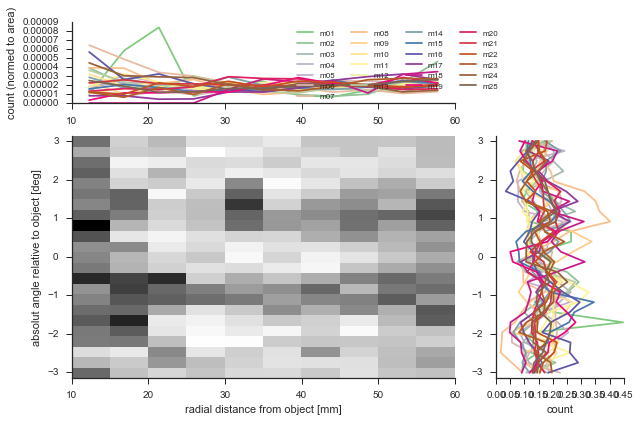

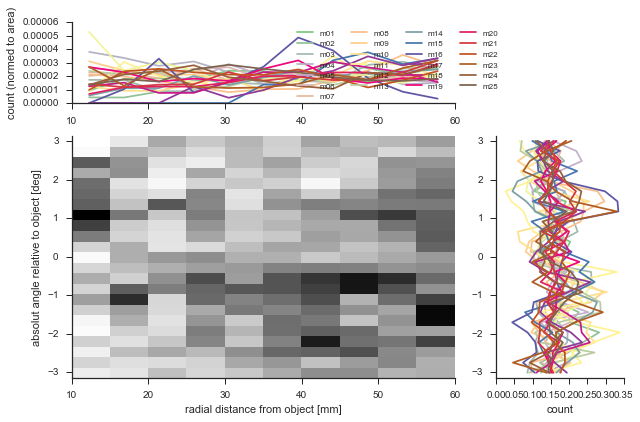

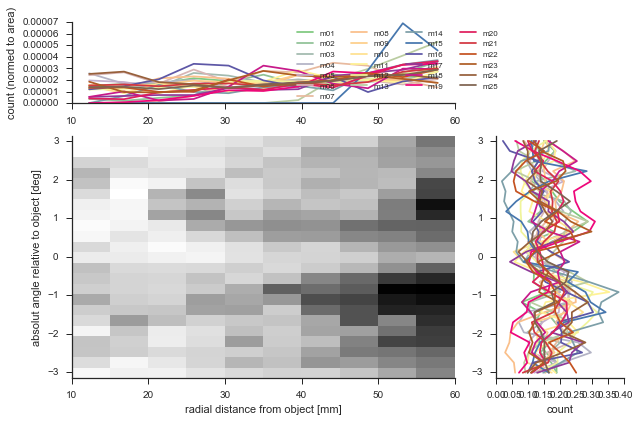

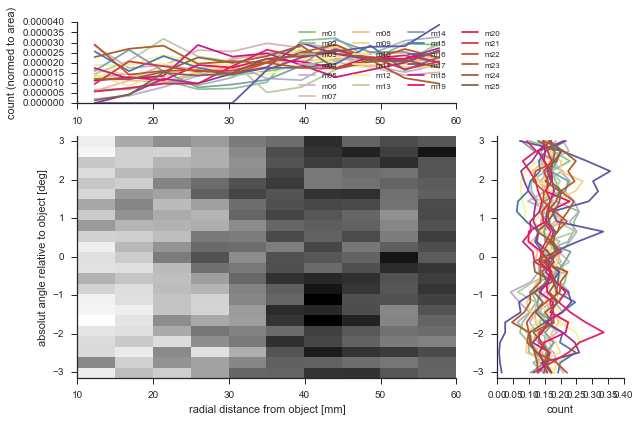

In [43]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad
minDist = 10

try:
    mkdir(analysisDir + 'headingVsDistance/')
except:
    print('Plot directory already exists')

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray,
                                           objDistMAall,gammaFullall)
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

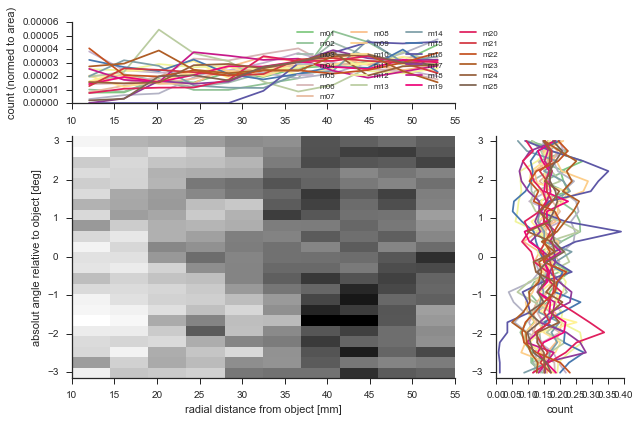

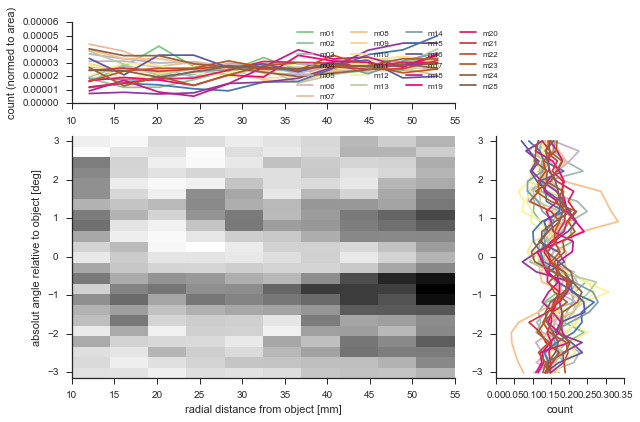

In [44]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad-5
minDist = 10

for ttind,trialtype in enumerate(list(set(visibilityState))):
    querystring = '(trialtype == "'+trialtype+'")'+\
        '& (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray,
                                           objDistMAall,gammaFullall)
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

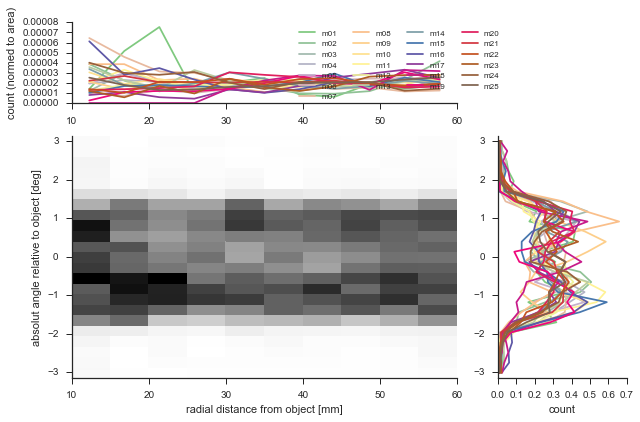

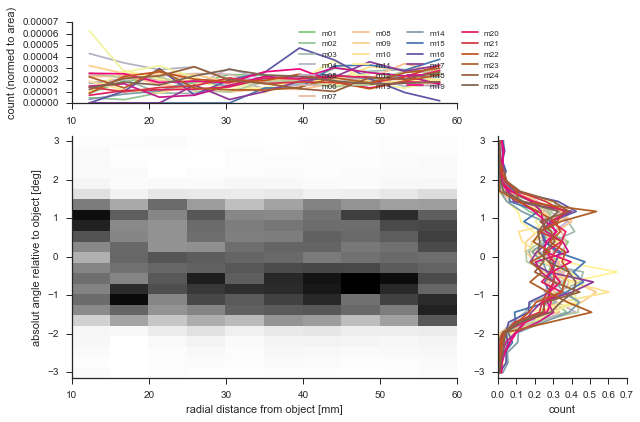

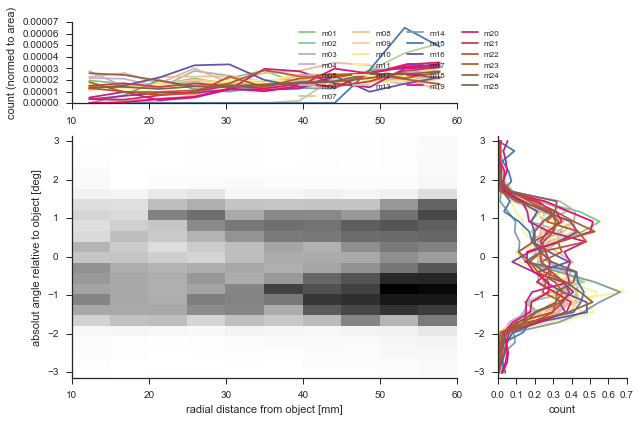

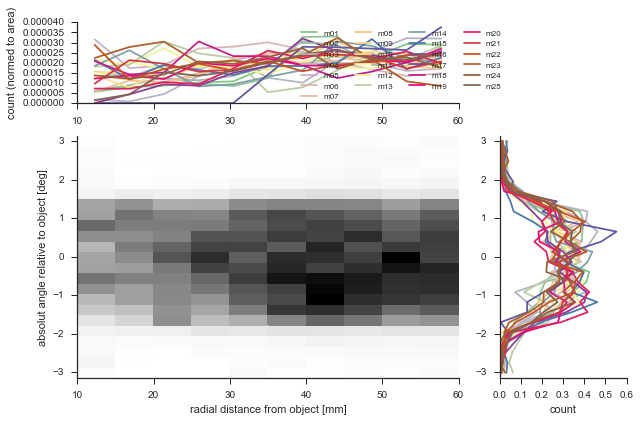

In [45]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    d_objDist = np.hstack((0, np.diff(np.convolve(objDistMAall, np.ones((7,))/7, mode='same'))))

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray[d_objDist<0],
                                           objDistMAall[d_objDist<0],gammaFullall[d_objDist<0])
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_apr_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

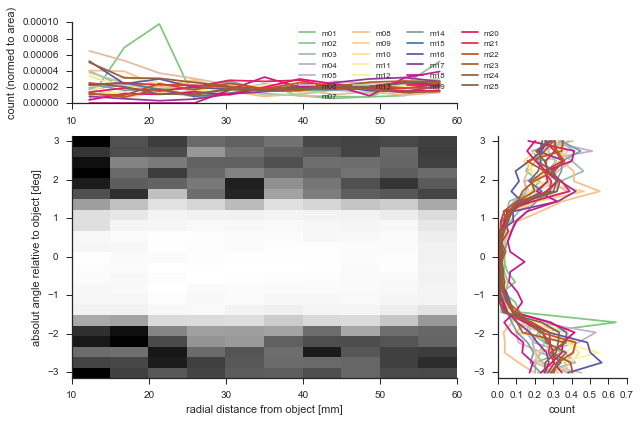

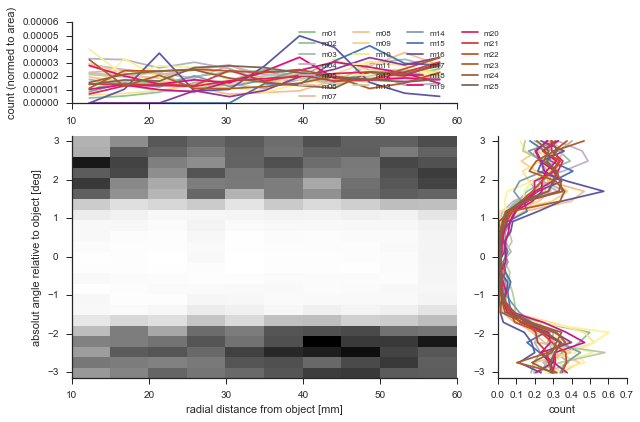

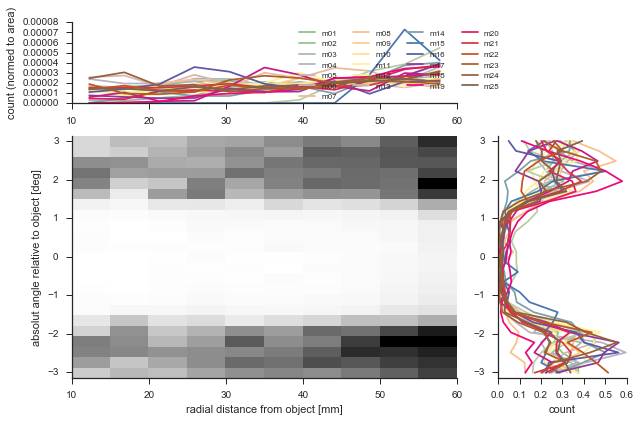

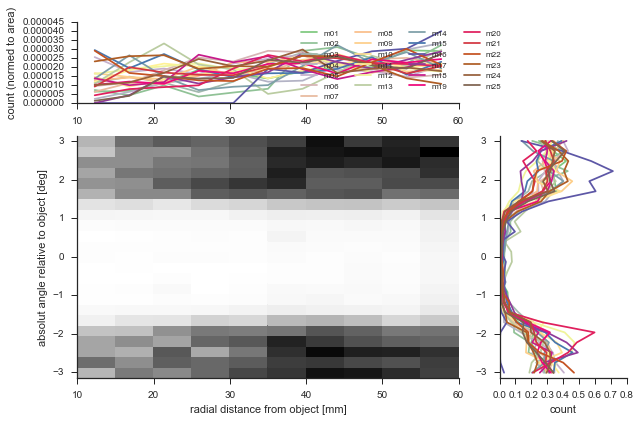

In [46]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    d_objDist = np.hstack((0, np.diff(np.convolve(objDistMAall, np.ones((7,))/7, mode='same'))))

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray[d_objDist>0],
                                           objDistMAall[d_objDist>0],gammaFullall[d_objDist>0])
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_dep_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

## Analysis of steering maneuvres and their relationship with the object location

### Turnrate relative to object distance

Plot directory already exists


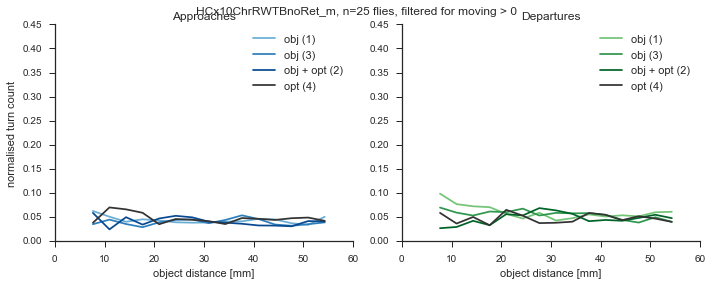

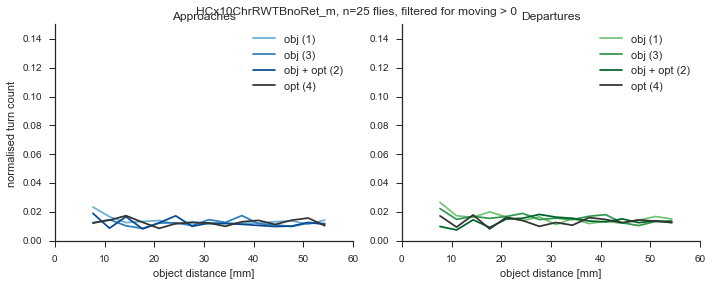

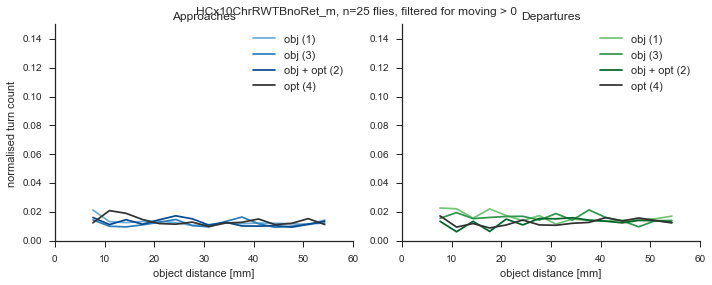

In [47]:
numBins = 15
useTurnIndex = False
movementFilter='moving > 0'

try:
    mkdir(analysisDir + 'turnRates/')
except:
    print('Plot directory already exists')

useTurnChange = 0

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.45)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+
            '_turnRatePerDistance_aboveTH'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

useTurnChange = 1

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.15)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+
            '_turnRatePerDistance_turnStart'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

useTurnChange = -1

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.15)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+
            '_turnRatePerDistance_turnEnd'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Polar coord maps of movement parameter

In [54]:
minDist = 6
maxDist = 56
distEdges = np.linspace(minDist, maxDist, 10)
angleEdges = np.linspace(0, np.pi, 9)
fullAngleEdges = np.linspace(-np.pi, np.pi, 18)
maxVals = (20.0,10.0, 1.5, 0.3)# (12.0,7.0, 1.0, 0.3) #

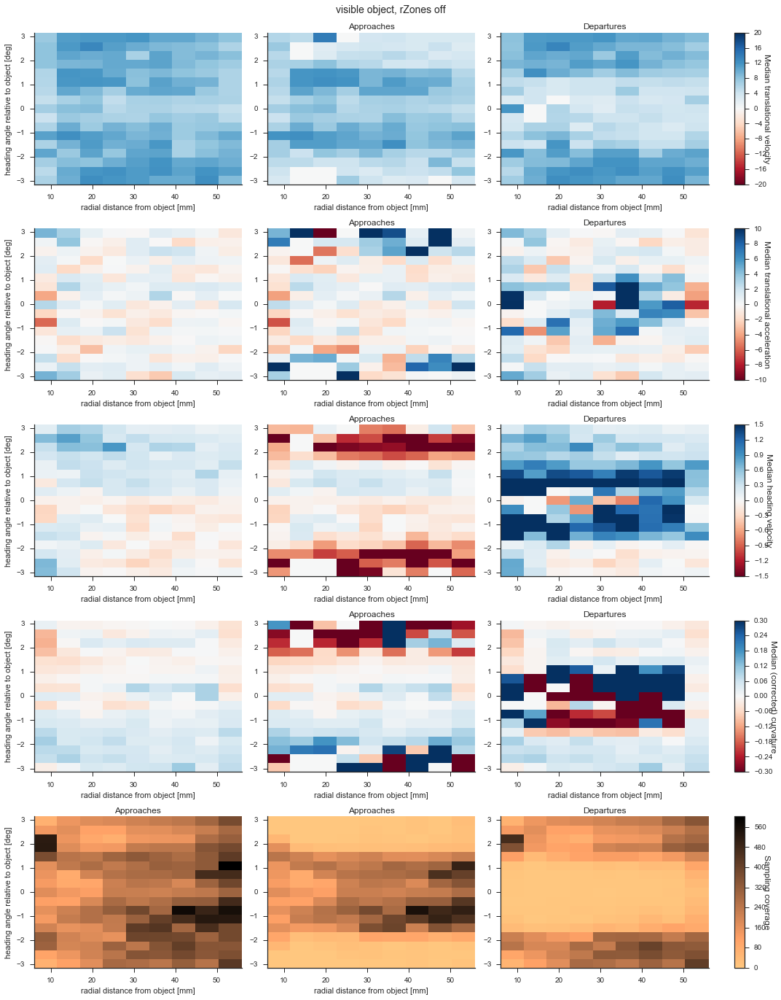

In [71]:
#for tind,trialtype in enumerate(visibilityState):
trial = 1
trialtype = 'visible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

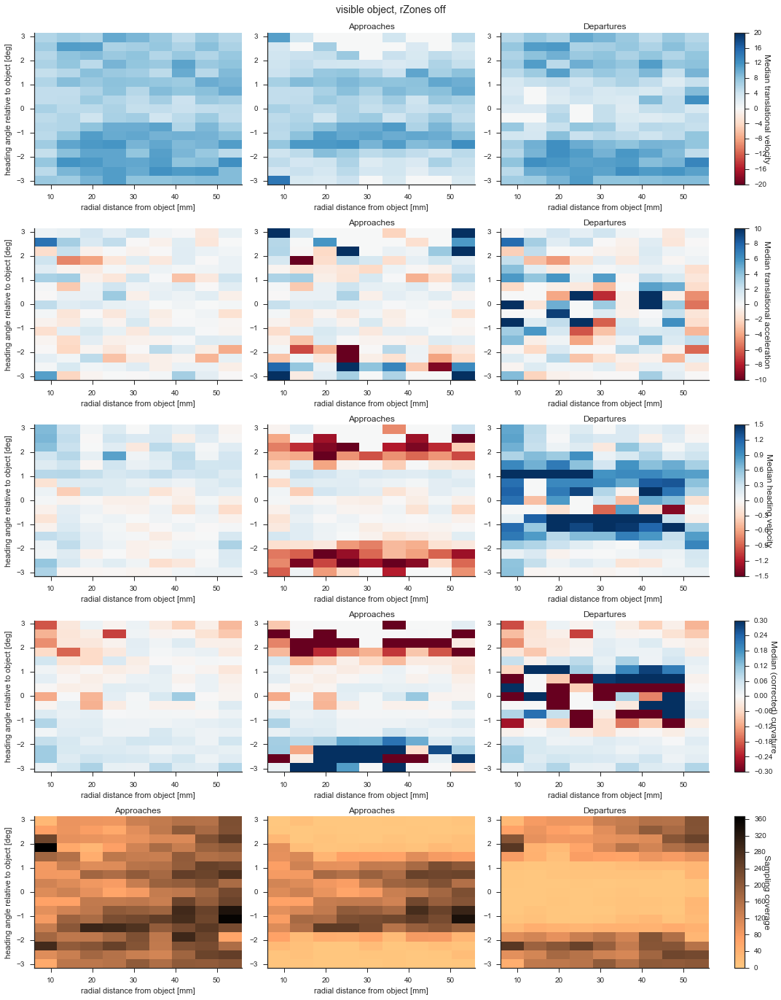

In [72]:
trialtype = 'visible'
trial = 2

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

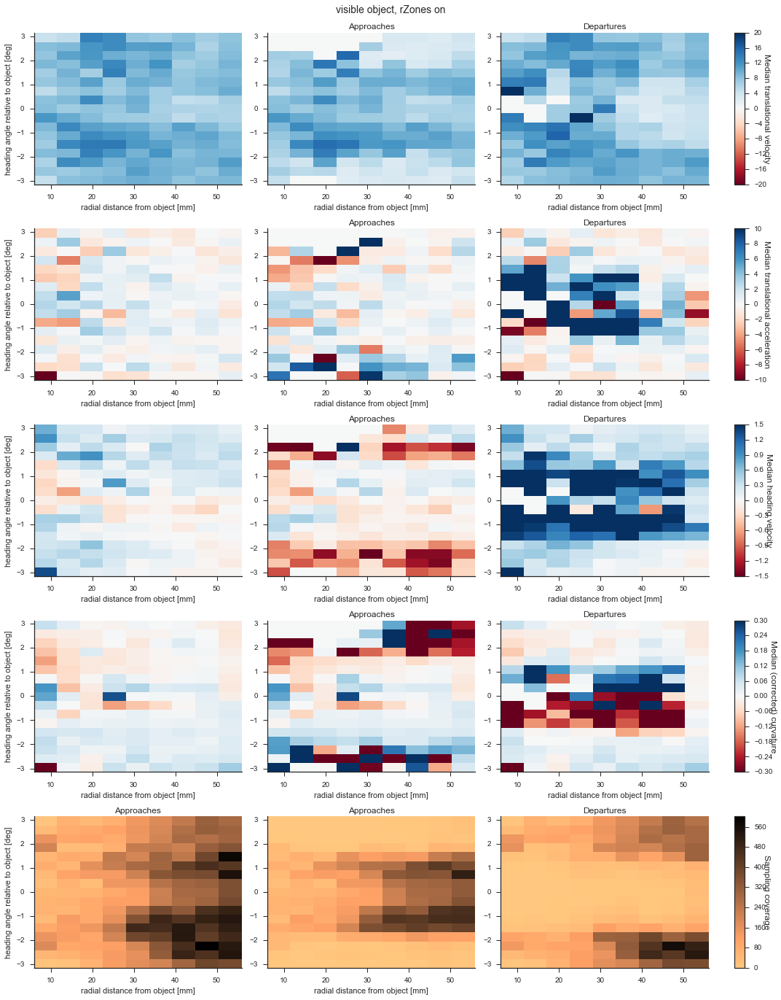

In [73]:
trialtype = 'visible'
trial = 3

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

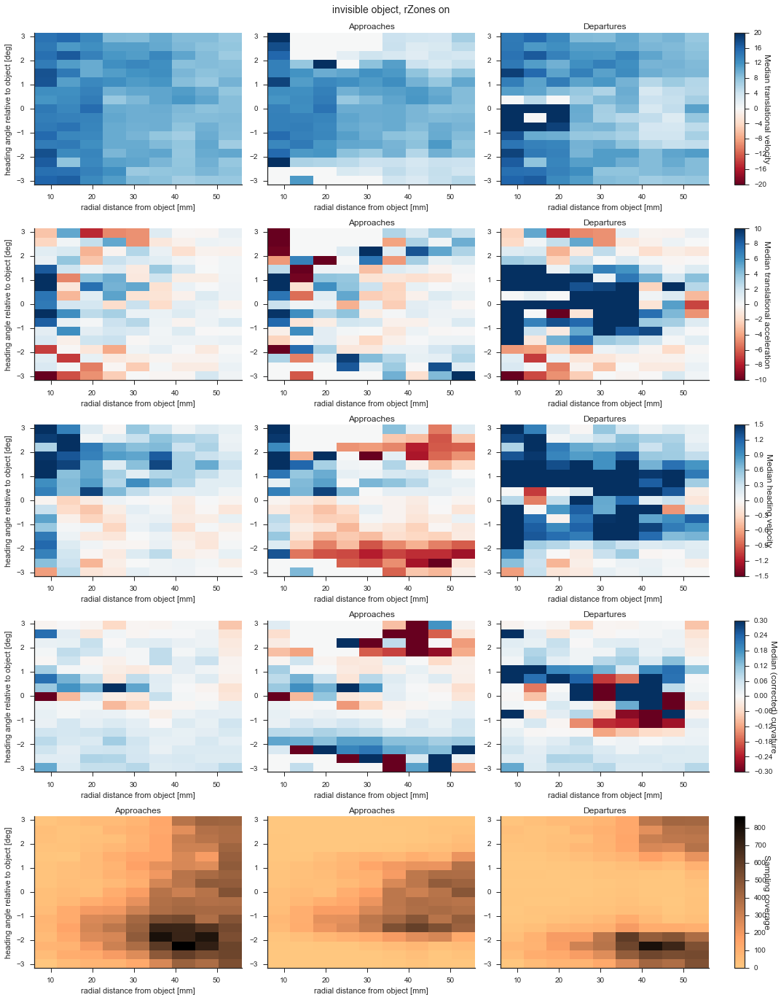

In [74]:
trialtype = 'invisible'
trial = 4

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

### Per-fly comparison between trials

In [48]:
rZone_rOuter

40

Analysis directory already exists.


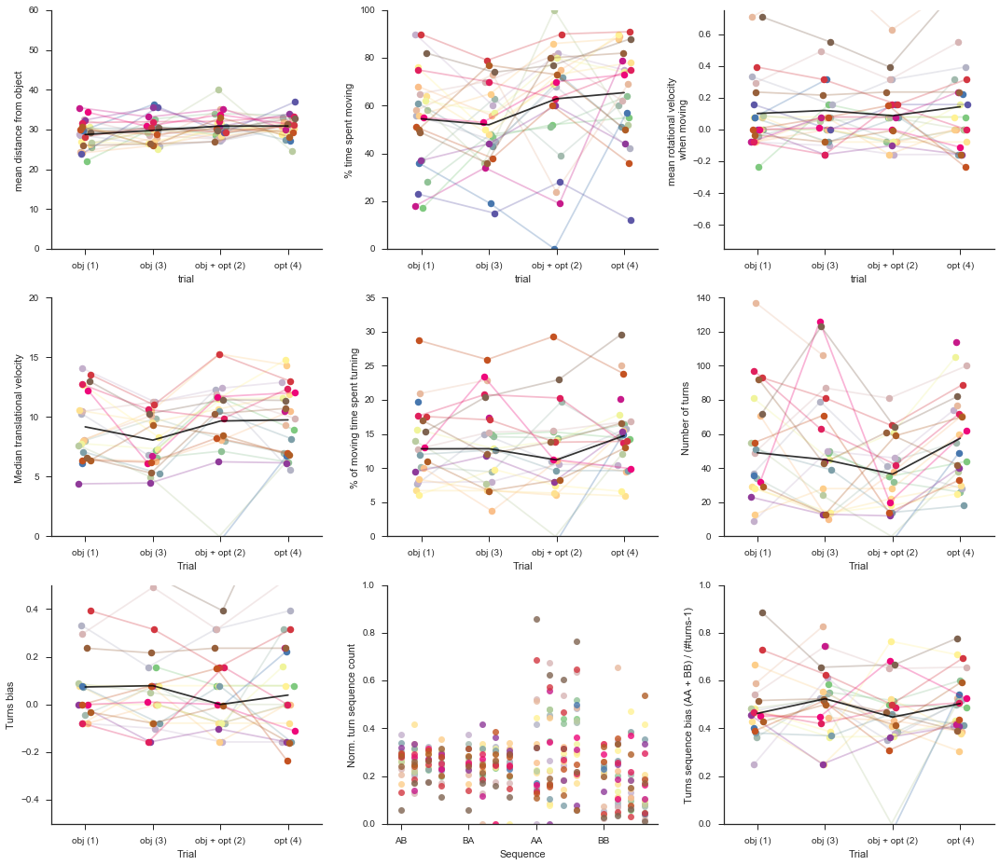

In [75]:
# make fly summary plot of residency:
arenaRad = 60
numtrials = len(visibilityState)
numVItrials = sum(['visible' in visibilityState[trial] for trial in range(len(visibilityState))])
numIVtrials = len(visibilityState)-numVItrials

minTurnDist = 5

minDist = 10 #rZone_rOuter
maxDist = rZone_rOuter#arenaRad

trialComparisonFig = plt.figure(figsize=(15,13))
gs = gridspec.GridSpec(3,3) #,width_ratios=[1,0.9])

nTrial = [nTrialsNR/2, nTrialsNR/2,nTrialsR/2, nTrialsIN]

# Top row plots: ...............................................................................................

# Plots of (a) percent of time spent moving, (b) rotational bias and (c) mean distance from object
percentMoving = np.zeros((numFlies,numtrials))
rotationBias = np.zeros((numFlies,numtrials))
meanObjDist = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

perFlyMeanDistPlt = trialComparisonFig.add_subplot(gs[0,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyRotBiasPlt = trialComparisonFig.add_subplot(gs[0,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')


for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +'")'\
                        +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int')
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                       +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')
        perFlyObjDist = FOAllFlies_df.query(querystring).iloc[:,keyind_objD:keyind_objD+1].squeeze().astype('float')
        
        if np.asarray(perFlyMoving).size ==1:
            percentMoving[fly,trial] = 100*perFlyMoving
        else:
            percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        
        rotationBias[fly,trial] = np.nanmedian(perFlyRot)
        meanObjDist[fly,trial] = np.nanmedian(perFlyObjDist)
        
        perFlyMovingPlt.plot(trial+1+tJitter,percentMoving[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))

        perFlyRotBiasPlt.plot(trial+1+tJitter,rotationBias[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        perFlyMeanDistPlt.plot(trial+1+tJitter,meanObjDist[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+jitter[fly,:],percentMoving[fly,:],
                         '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    perFlyRotBiasPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,rotationBias[fly,:],'-',
                          markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
        
    perFlyMeanDistPlt.plot(range(1,numtrials+1)+jitter[fly,:],meanObjDist[fly,:],'-',
                         markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,numtrials+1),np.nanmean(rotationBias,axis=0),color='k',alpha=0.8)
perFlyMeanDistPlt.plot(range(1,numtrials+1),np.nanmean(meanObjDist,axis=0),color='k',alpha=0.8)

# Beautify axes
perFlyMeanDistPlt.set_ylim(0,arenaRad)
perFlyMeanDistPlt.set_xlim(0.5,numtrials+0.5)
perFlyMeanDistPlt.set_xlabel('trial')
perFlyMeanDistPlt.set_ylabel('mean distance from object')
myAxisTheme(perFlyMeanDistPlt)

perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('trial')
perFlyMovingPlt.set_ylabel('% time spent moving')
myAxisTheme(perFlyMovingPlt)

perFlyRotBiasPlt.set_ylim(-0.75,0.75)
perFlyRotBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyRotBiasPlt.set_xlabel('trial')
perFlyRotBiasPlt.set_ylabel('mean rotational velocity \n when moving')
myAxisTheme(perFlyRotBiasPlt)

# Bottom row plots: ...............................................................................................

# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])

percentMoving = np.zeros((numFlies,numtrials))
perFlyTurnTH = np.zeros((numFlies,numtrials))
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyTurnDir = np.zeros((numFlies,numtrials))
perFlyTurnSeqBias = np.zeros((numFlies,numtrials))

randJitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[1,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnTHPlt = trialComparisonFig.add_subplot(gs[1,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyNumTurnPlt = trialComparisonFig.add_subplot(gs[1,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyTurnDirPlt = trialComparisonFig.add_subplot(gs[2,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnSeqPlt = trialComparisonFig.add_subplot(gs[2,1])
plt.xticks([0,1,2,3],['AB','BA','AA','BB'])
perFlyTurnSeqBiasPlt = trialComparisonFig.add_subplot(gs[2,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):
        
        jitter = np.random.uniform(-0.1, 0.1)
        randJitter[fly,trial] = jitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'\
                      +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        if perFlyMoving.size < 5:
            continue
            
        if (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving)) < 30:
            percentMoving[fly,trial] = np.nan
            perFlyTurnTH[fly,trial] = np.nan
            perFlyNumTurn[fly,trial] = np.nan
            perFlyTurnDir[fly,trial] = np.nan
            perFlyTurnSeqBias[fly,trial] = np.nan
            continue

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        perFlyTurnTH[fly,trial] = 100.0*(sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg))/max(1,len(perFlyRot_filt))
        perFlyNumTurn[fly,trial] = len(turnStart)
        perFlyTurnDir[fly,trial] = np.nanmedian(perFlyRot)
        #abs((1.0*sum(perFlyRot_filt>turnTH_pos) - sum(perFlyRot_filt<turnTH_neg))/
        #                               max(1.0*sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg),1))
        if sum(n)==0:
            perFlyTurnSeqBias[fly,trial] = np.nan
        else:
            perFlyTurnSeqBias[fly,trial] = float(sum(n[2:]))/sum(n)
        
        alphaVal = min(perFlyNumTurn[fly,trial]/3,1)
        
        percentMoving[fly,trial] = np.nanmedian(perFlyTra)
        
        perFlyMovingPlt.plot(trial+1+jitter,percentMoving[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnTHPlt.plot(trial+1+jitter,perFlyTurnTH[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyNumTurnPlt.plot(trial+1+jitter,perFlyNumTurn[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyTurnDirPlt.plot(trial+1+jitter,perFlyTurnDir[fly,trial],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqPlt.plot(range(numBin)+np.ones(numBin)*0.2*trial,n/(np.ones(numBin)*sum(n)),
                              marker = 'o',linestyle='none',alpha = 0.8,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqBiasPlt.plot(trial+1+jitter,perFlyTurnSeqBias[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+randJitter[fly,:],percentMoving[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)    
    perFlyTurnTHPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnTH[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyNumTurnPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyNumTurn[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnDirPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnDir[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnSeqBias[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyTurnTHPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnTH,axis=0),color='k',alpha=0.8)
perFlyNumTurnPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyNumTurn,axis=0),color='k',alpha=0.8)
perFlyTurnDirPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnDir,axis=0),color='k',alpha=0.8)
perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnSeqBias,axis=0),color='k',alpha=0.8)

# Beautify axes
perFlyMovingPlt.set_ylim(0,20)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('Trial')
perFlyMovingPlt.set_ylabel('Median translational velocity')
myAxisTheme(perFlyMovingPlt)

perFlyTurnTHPlt.set_ylim(0,35)
perFlyTurnTHPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnTHPlt.set_xlabel('Trial')
perFlyTurnTHPlt.set_ylabel('% of moving time spent turning')
myAxisTheme(perFlyTurnTHPlt)

perFlyNumTurnPlt.set_xlim(0.5,numtrials+0.5)
perFlyNumTurnPlt.set_xlabel('Trial')
perFlyNumTurnPlt.set_ylabel('Number of turns')
myAxisTheme(perFlyNumTurnPlt)

perFlyTurnDirPlt.set_ylim(-0.5,0.5)
perFlyTurnDirPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnDirPlt.set_xlabel('Trial')
perFlyTurnDirPlt.set_ylabel('Turns bias')
myAxisTheme(perFlyTurnDirPlt)

perFlyTurnSeqPlt.set_ylim(0,1)
perFlyTurnSeqPlt.set_xlim(-0.2,numBin-0.2)
perFlyTurnSeqPlt.set_xlabel('Sequence')
perFlyTurnSeqPlt.set_ylabel('Norm. turn sequence count')
myAxisTheme(perFlyTurnSeqPlt)

perFlyTurnSeqBiasPlt.set_ylim(0,1)
perFlyTurnSeqBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnSeqBiasPlt.set_xlabel('Trial')
perFlyTurnSeqBiasPlt.set_ylabel('Turns sequence bias (AA + BB) / (#turns-1)')
myAxisTheme(perFlyTurnSeqBiasPlt)

trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareAllTrials' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir+'compareAllTrials/'+genotype+'_'+flyIDs[0][0]
                   +'_allTrials_'+str(minDist)+'-'+str(maxDist)+'_n'+str(len(flyIDs))+'.pdf', format='pdf')

In [53]:
def pltScatterMedIQR(spthandle,y,randjitter,col,trial):
    # add scatterplot + median + iqr of total number of visits

    #x = trial + np.random.uniform(-jittersize,jittersize,size=len(y))
    x = trial + randjitter[:,trial-1]
    spthandle.plot(x,y,color=col, marker='o', linestyle='none', alpha=0.7)
    spthandle.plot([trial-jittersize,trial+jittersize], [np.nanmedian(y),np.nanmedian(y)], color='black', linewidth=4)
    spthandle.plot([trial,trial], np.nanpercentile(y,[25,75]), color='grey', linewidth=1)
    
    return spthandle

Analysis directory already exists.


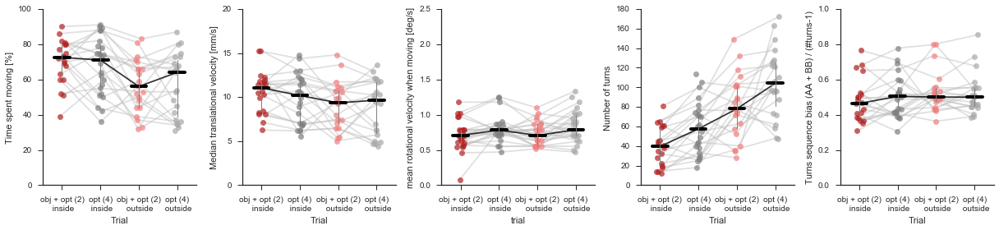

In [54]:
# make fly summary plot of residency:
arenaRad = 60
trialIDs = [2,3,2,3]
colmap = ['firebrick','grey','lightcoral','darkgrey']
xticklabels = [trialName[2]+'\n inside',trialName[3]+'\n inside',trialName[2]+'\n outside',trialName[3]+'\n outside']
numtrials = len(trialIDs)
numVItrials = sum(['visible' in visibilityState[trial] for trial in range(len(visibilityState))])
numIVtrials = len(visibilityState)-numVItrials

minTurnDist = 5

minDists = [10,10,rZone_rOuter,rZone_rOuter]
maxDists = [rZone_rOuter,rZone_rOuter, arenaRad,arenaRad]

trialComparisonFig = plt.figure(figsize=(17,4))
gs = gridspec.GridSpec(1,5)

nTrial = [nTrialsNR/2, nTrialsNR/2,nTrialsR/2, nTrialsIN]

# plots: ...............................................................................................
percentMoving = np.zeros((numFlies,numtrials))
transVelo = np.zeros((numFlies,numtrials))
rotationBias = np.zeros((numFlies,numtrials))
perFlyTurnTH = np.zeros((numFlies,numtrials))
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyTurnSeqBias = np.zeros((numFlies,numtrials))

randJitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,0])
plt.xticks([1,2,3,4],xticklabels, rotation='horizontal')
perFlyTransPlt = trialComparisonFig.add_subplot(gs[0,1])
plt.xticks([1,2,3,4],xticklabels, rotation='horizontal')
perFlyRotBiasPlt = trialComparisonFig.add_subplot(gs[0,2])
plt.xticks([1,2,3,4],xticklabels, rotation='horizontal')
perFlyNumTurnPlt = trialComparisonFig.add_subplot(gs[0,3])
plt.xticks([1,2,3,4],xticklabels, rotation='horizontal')
perFlyTurnSeqBiasPlt = trialComparisonFig.add_subplot(gs[0,4])
plt.xticks([1,2,3,4],xticklabels, rotation='horizontal')


# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])


for fly in range(numFlies):
    for tind, trial in enumerate(trialIDs):
        
        minDist = minDists[tind]
        maxDist = maxDists[tind]

        tJitter = np.random.uniform(-0.1, 0.1)
        
        jitter = np.random.uniform(-0.1, 0.1)
        randJitter[fly,tind] = jitter

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                       +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')

        rotationBias[fly,tind] = np.nanmedian(abs(perFlyRot))                
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'\
                      +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        if (perFlyMoving.size < 5) or ((100.0*sum(perFlyMoving))/max(1,len(perFlyMoving)) < 30):
            percentMoving[fly,tind] = np.nan
            transVelo[fly,tind] = np.nan
            perFlyTurnTH[fly,tind] = np.nan
            perFlyNumTurn[fly,tind] = np.nan
            perFlyTurnSeqBias[fly,tind] = np.nan
            continue
      
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        perFlyNumTurn[fly,tind] = len(turnStart)
 
        if sum(n)==0:
            perFlyTurnSeqBias[fly,tind] = np.nan
        else:
            perFlyTurnSeqBias[fly,tind] = float(sum(n[2:]))/sum(n)
            
        
        
        alphaVal = min(perFlyNumTurn[fly,tind]/3,1)
        percentMoving[fly,tind] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        transVelo[fly,tind] = np.nanmedian(perFlyTra)
    
    perFlyMovingPlt.plot(range(1,numtrials+1)+randJitter[fly,:],percentMoving[fly,:],'-',
                         markersize=15,color = 'silver', alpha=0.5) 

    perFlyTransPlt.plot(range(1,numtrials+1)+randJitter[fly,:],transVelo[fly,:],'-',
                         markersize=15,color = 'silver', alpha=0.5)   
    
    perFlyRotBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],rotationBias[fly,:],'-',
                         markersize=15,color = 'silver', alpha=0.5)   

    perFlyNumTurnPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyNumTurn[fly,:],'-',
                         markersize=15,color = 'silver', alpha=0.5)
    
    perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnSeqBias[fly,:],'-',
                         markersize=15,color = 'silver', alpha=0.5)

#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmedian(percentMoving,axis=0),color='k',alpha=0.8)
perFlyTransPlt.plot(range(1,numtrials+1),np.nanmedian(transVelo,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,numtrials+1),np.nanmedian(rotationBias,axis=0),color='k',alpha=0.8)
perFlyNumTurnPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyNumTurn,axis=0),color='k',alpha=0.8)
perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnSeqBias,axis=0),color='k',alpha=0.8)

for tind, trial in enumerate(range(1,numtrials+1)):
    perFlyMovingPlt = pltScatterMedIQR(perFlyMovingPlt,percentMoving[:,tind],randJitter,colmap[tind],trial)
    perFlyTransPlt = pltScatterMedIQR(perFlyTransPlt,transVelo[:,tind],randJitter,colmap[tind],trial)
    perFlyRotBiasPlt = pltScatterMedIQR(perFlyRotBiasPlt,rotationBias[:,tind],randJitter,colmap[tind],trial)
    perFlyNumTurnPlt = pltScatterMedIQR(perFlyNumTurnPlt,perFlyNumTurn[:,tind],randJitter,colmap[tind],trial)
    perFlyTurnSeqBiasPlt = pltScatterMedIQR(perFlyTurnSeqBiasPlt,perFlyTurnSeqBias[:,tind],randJitter,colmap[tind],trial)    


# Beautify axes
perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('Trial')
perFlyMovingPlt.set_ylabel('Time spent moving [%]')
myAxisTheme(perFlyMovingPlt)

perFlyTransPlt.set_ylim(0,20)
perFlyTransPlt.set_xlim(0.5,numtrials+0.5)
perFlyTransPlt.set_xlabel('Trial')
perFlyTransPlt.set_ylabel('Median translational velocity [mm/s]')
myAxisTheme(perFlyTransPlt)

perFlyRotBiasPlt.set_ylim(0,2.5)
perFlyRotBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyRotBiasPlt.set_xlabel('trial')
perFlyRotBiasPlt.set_ylabel('mean rotational velocity when moving [deg/s]')
myAxisTheme(perFlyRotBiasPlt)

perFlyNumTurnPlt.set_xlim(0.5,numtrials+0.5)
perFlyNumTurnPlt.set_xlabel('Trial')
perFlyNumTurnPlt.set_ylabel('Number of turns')
myAxisTheme(perFlyNumTurnPlt)

perFlyTurnSeqBiasPlt.set_ylim(0,1)
perFlyTurnSeqBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnSeqBiasPlt.set_xlabel('Trial')
perFlyTurnSeqBiasPlt.set_ylabel('Turns sequence bias (AA + BB) / (#turns-1)')
myAxisTheme(perFlyTurnSeqBiasPlt)

trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareAllTrials' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir+'compareAllTrials/'+genotype+'_'+flyIDs[0][0]
                   +'_reinforcementTrials_'+str(minDist)+'-'+str(maxDist)+'_v2_n'+str(len(flyIDs))+'.pdf', format='pdf')

## Characterise turns at border or rZone

In [ ]:
def countvisits(dist2Obj,visitRad):
    # count visits
    inside = (dist2Obj<visitRad).astype('int')
    time = np.linspace(0,600,len(dist2Obj))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    if len(entryTime) != len(exitTime):
        visitT = exitTime[0:min(sum(exits),sum(entries))] - entryTime[0:min(sum(exits),sum(entries))]
    else:
        visitT = exitTime - entryTime
        
    return entries.astype('bool'), exits.astype('bool'), visitT, entryTime, exitTime

fly: m13


/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Analysis directory already exists.


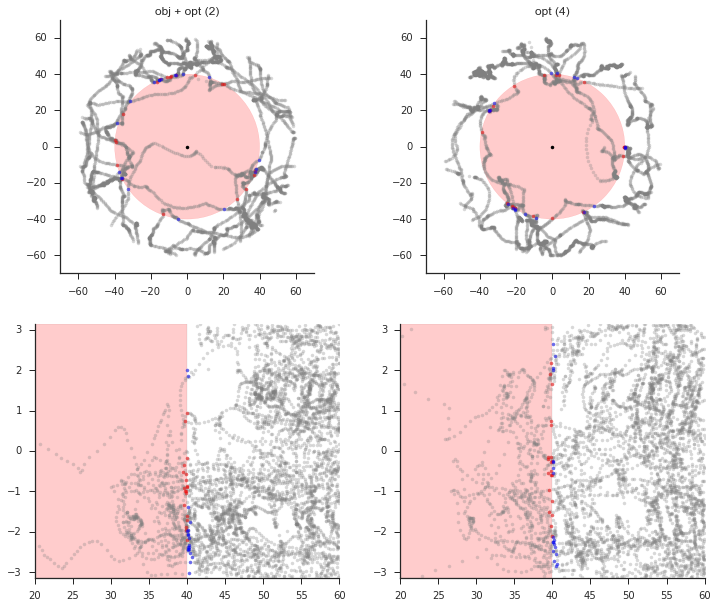

In [72]:
fly = 12

borderFig, splts = plt.subplots(2, 2, figsize=(12,10))

print('fly: '+flyIDs[fly])

import matplotlib.patches as ptchs

for tind,trial in enumerate([3,4]):
    traj = splts[0, tind]
    pol = splts[1, tind]
    rZonePlt = plt.Circle((0,0),rZone_rOuter,color='red',alpha=0.2)
    
    querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
    perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
    perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
    perFlyH = FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1].squeeze().astype('float').values
    perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
    perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values
    
    perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
    perFlyObjDist_d = np.hstack((0,np.diff(perFlyObjDist)))
    
    visitRad = rZone_rOuter
    entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

    traj.plot(perFlyX, perFlyY,'.',color = 'grey', alpha=0.3)
    traj.plot(perFlyX[entries], perFlyY[entries],'.',color = 'red', alpha=0.5)
    traj.plot(perFlyX[exits], perFlyY[exits],'.',color = 'blue', alpha=0.5)
    traj.add_artist(rZonePlt)
    traj.plot(0,0,'.',color='black')
    traj.axis([-arenaRad-10, arenaRad+10, -arenaRad-10, arenaRad+10])
    traj.set_aspect('equal')
    traj.set_title(trialName[trial-1])
    myAxisTheme(traj)
    
    pol.plot(perFlyObjDist, perFlyG,'.',color = 'grey', alpha=0.3)
    #pol.plot(perFlyObjDist[perFlyObjDist_d<0], perFlyG[perFlyObjDist_d<0],'.',color = 'grey', alpha=0.2)

    pol.plot(perFlyObjDist[entries], perFlyG[entries],'.',color = 'red', alpha=0.5)
    pol.plot(perFlyObjDist[exits], perFlyG[exits],'.',color = 'blue', alpha=0.5)
    pol.set_xlim(20,arenaRad)
    pol.set_ylim(-np.pi,np.pi)
    
    pol.add_patch(
        ptchs.Rectangle(
            (0, -np.pi),   # (x,y)
            rZone_rOuter,  # width
            2*np.pi,    # height
            facecolor='red',
            alpha=0.2
        )
    )
    myAxisTheme(pol)
    
try:
    mkdir(analysisDir + sep + 'borderZone' + sep)
except OSError:
    print('Analysis directory already exists.')

borderFig.savefig(analysisDir + 'borderZone/'  + genotype
                   + '_trajInTransitionZone_fly'+ flyIDs[fly] +'.pdf', format='pdf')  

In [73]:
def transitionTrajPlots (eventpts, eventlabel, eventsplts, xlimits):
    
    fragm = eventsplts[0,tind]
    polfragm = eventsplts[1,tind]
    headfragm = eventsplts[2,tind]
    
    for event in eventpts:
        fragm.plot(perFlyX[event+preWindow:event+postWindow],perFlyY[event+preWindow:event+postWindow],'.',alpha=0.5)
        fragm.plot(perFlyX[event],perFlyY[event],'k.',alpha=0.5)
        fragm.plot(0,0,'.',color='black')
        fragm.axis([-rZone_rOuter-10, rZone_rOuter+10, -rZone_rOuter-10, rZone_rOuter+10])
        fragm.set_aspect('equal')
        fragm.set_title(eventlabel + ' in trial ' + trialName[trial-1],fontsize=12)
        myAxisTheme(fragm)
    
        polfragm.plot(perFlyObjDist[event+preWindow:event+postWindow],abs(perFlyG[event+preWindow:event+postWindow]),'.-',alpha=0.5)
        polfragm.plot(perFlyObjDist[event],abs(perFlyG[event]),'k.',alpha=0.5)
        polfragm.set_xlim(xlimits)
        polfragm.set_ylim(0,np.pi)
        polfragm.set_xlabel('landmark distance [mm]')
        polfragm.set_ylabel('relative heading [rad]')
        myAxisTheme(polfragm)
        
        headfragm.plot(abs(perFlyG[event+preWindow:event+postWindow]),'.-',alpha=0.5)
        headfragm.plot(abs(preWindow),abs(perFlyG[event]),'k.',alpha=0.5)
        headfragm.set_ylim(0,np.pi)
        headfragm.set_xlabel('time [frames]')
        headfragm.set_ylabel('relative heading [rad]')
        myAxisTheme(headfragm)
    
    return eventsplts

In [74]:
visitRad = rZone_rOuter-5
preWindow = 20*-0.0#-0.5
postWindow = 20*2.0 #2.0 #2.5

windowSize = abs(preWindow)+postWindow

fly: m05


/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:8: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:16: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:24: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


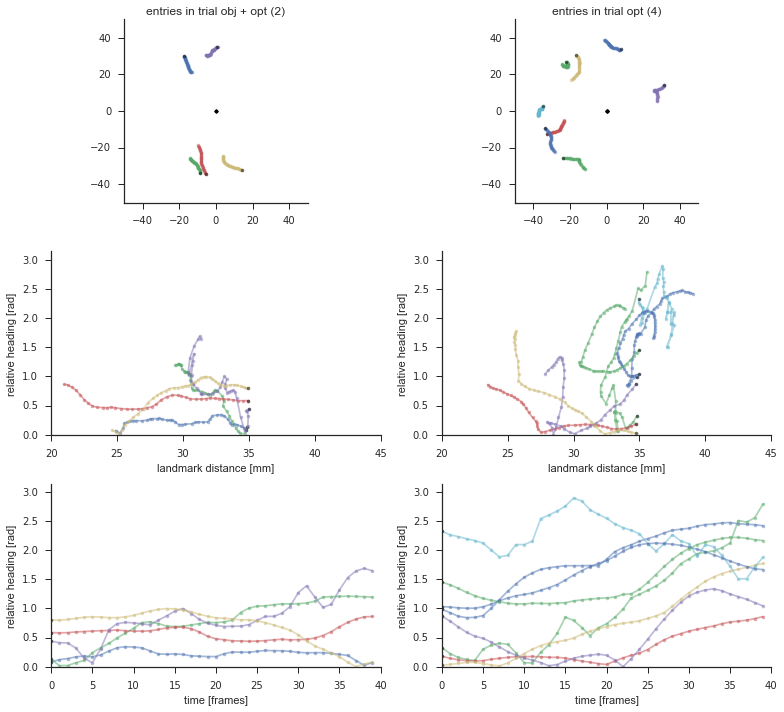

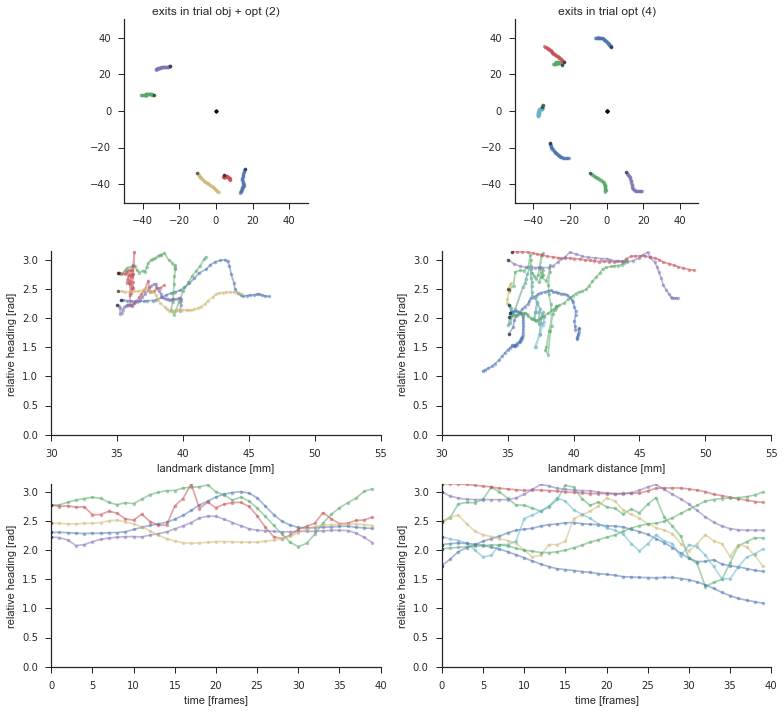

In [75]:
fly = 4

#important parameter defined above...

entryFig, entrysplts = plt.subplots(3, 2, figsize=(11,10))
exitFig, exitsplts = plt.subplots(3, 2, figsize=(11,10))

print('fly: '+flyIDs[fly])

import matplotlib.patches as ptchs

for tind,trial in enumerate([3,4]):
    querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
    perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
    perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
    perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
    perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values
    
    perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
    perFlyObjDist_d = np.hstack((0,np.diff(perFlyObjDist)))
    
    entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)
    
    entrypts = [i for i, x in enumerate(entries) if x]
    exitpts = [i for i, x in enumerate(exits) if x]
    
    entrysplts = transitionTrajPlots(entrypts, 'entries', entrysplts, [20,rZone_rOuter+5])
    exitsplts = transitionTrajPlots(exitpts, 'exits', exitsplts, [30,rZone_rOuter+15])
    
        
entryFig.tight_layout()
exitFig.tight_layout()

entryFig.savefig(analysisDir + 'borderZone/'  + genotype
                   + '_entryTrajectories_fly'+ flyIDs[fly] +'.pdf', format='pdf')  
exitFig.savefig(analysisDir + 'borderZone/'  + genotype
                   + '_exitTrajectories_fly'+ flyIDs[fly] +'.pdf', format='pdf')  

/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:26: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:31: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


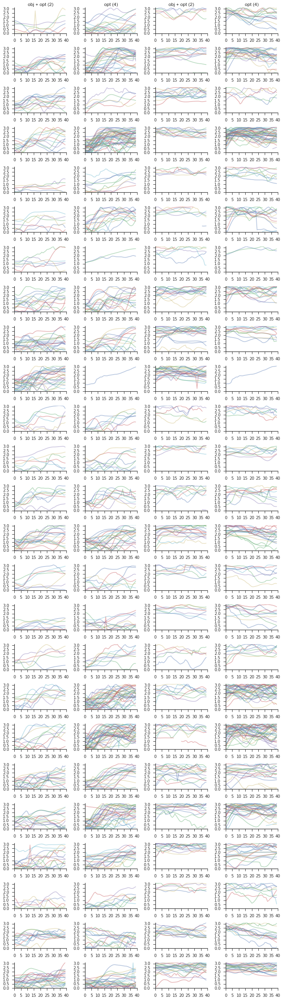

In [76]:
# all flies
borderFig, splts = plt.subplots(numFlies, 4, figsize=(10,35))

for fly in range(len(flyIDs)):
    for tind,trial in enumerate([3,4]):
        headfragm = splts[fly,0+tind]; myAxisTheme(headfragm)
        headfragm2 = splts[fly,2+tind]; myAxisTheme(headfragm2)

        querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
        perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

        perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
        perFlyObjDist_d = np.hstack((0,np.diff(perFlyObjDist)))

        polarCurv, d_theta, dtheta_objDist = polarCurvature(perFlyTheta, perFlyObjDist)

        entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

        entrypts = [i for i, x in enumerate(entries) if x]
        exitpts = [i for i, x in enumerate(exits) if x]
        
        for entry in entrypts:
            headfragm.plot(abs(perFlyG[entry+preWindow:entry+postWindow]),'-',alpha=0.4)
            headfragm.set_ylim(0,np.pi)
            if fly==0: headfragm.set_title(trialName[trial-1])

        for exit in exitpts:
            headfragm2.plot(abs(perFlyG[exit+preWindow:exit+postWindow]),'-',alpha=0.4)
            headfragm2.set_ylim(0,np.pi)
            if fly==0: headfragm2.set_title(trialName[trial-1])
        
    if tind==0: 
        headfragm.set_xlabel('time [frames]')
        headfragm.set_ylabel('relative heading [rad]')
        
borderFig.tight_layout()
borderFig.savefig(analysisDir + 'borderZone/'  + genotype
                   + '_transitionTrajectories_n'+ str(numFlies) +'.pdf', format='pdf') 

In [77]:
# all flies
histBins = 10
n_entryTraj = np.zeros((numFlies,2,histBins,histBins))
nsum_entryTraj = np.zeros((2,histBins,histBins))

n_exitTraj = np.zeros((numFlies,2,histBins,histBins))
nsum_exitTraj = np.zeros((2,histBins,histBins))

X,Y = np.meshgrid(np.linspace(0,windowSize,histBins+1),np.linspace(0,np.pi,histBins+1))

for fly in range(len(flyIDs)):
    
    for tind,trial in enumerate([3,4]):
        
        trialEntryplt = splts[fly,0+tind]
        trialExitplt = splts[fly,2+tind]

        querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values

        perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
        bjDist = polarCurvature(perFlyTheta, perFlyObjDist)

        entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

        entrypts = [i for i, x in enumerate(entries) if x]
        exitpts = [i for i, x in enumerate(exits) if x]
        timevec = np.array(range(int(windowSize)))

        entryFragms = np.nan*np.ones((len(entrypts),windowSize))
        exitFragms = np.nan*np.ones((len(exitpts),windowSize))
        timeVecEntry = np.nan*np.ones((len(entrypts),windowSize))
        timeVecExit = np.nan*np.ones((len(exitpts),windowSize))
        
        #entries
        for ind, entry in enumerate(entrypts[:-1]):
            entryFragms[ind,:] = abs(perFlyG[entry+preWindow:entry+postWindow])
            timeVecEntry[ind,:] = timevec
            
        entry1Dvec = np.ravel(entryFragms)
        time1Dvec = np.ravel(timeVecEntry)
        nanMask = np.isnan(entry1Dvec)

        n, xedges,yedges = np.histogram2d(entry1Dvec[~nanMask],time1Dvec[~nanMask])
        
        n_entryTraj[fly,tind,:,:] = n
        nsum_entryTraj[tind,:,:] = nsum_entryTraj[tind,:,:] + n

        #exits
        for ind, exit in enumerate(exitpts[:-1]):
            exitFragms[ind,:] = abs(perFlyG[exit+preWindow:exit+postWindow])
            timeVecExit[ind,:] = timevec
            
        exit1Dvec = np.ravel(exitFragms)
        time1Dvec = np.ravel(timeVecExit)
        nanMask = np.isnan(exit1Dvec)

        n, xedges,yedges = np.histogram2d(exit1Dvec[~nanMask],time1Dvec[~nanMask])
        
        n_exitTraj[fly,tind,:,:] = n
        nsum_exitTraj[tind,:,:] = nsum_exitTraj[tind,:,:] + n

/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:39: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:53: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [78]:
visitRad

35

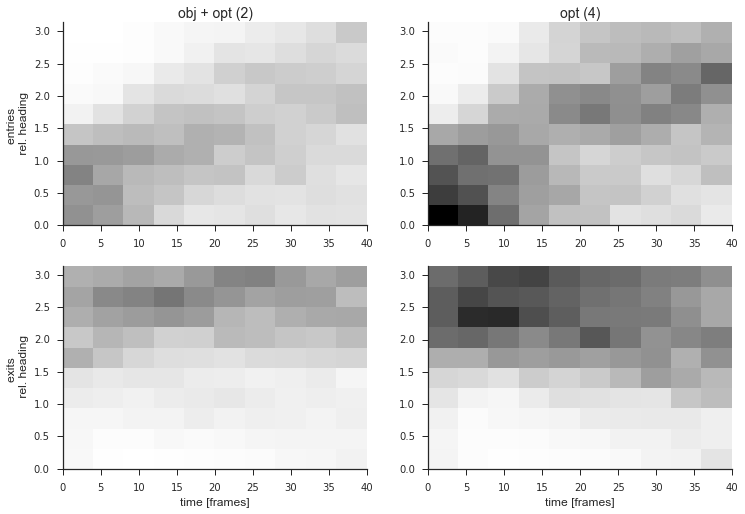

In [79]:
headingFragmHistFig, splts = plt.subplots(2, 2, figsize=(12,8))
z_min = np.min(nsum_entryTraj)
z_max = np.max(nsum_entryTraj)

for trial in range(2):
    entryplt = splts[0,trial]
    entryplt.pcolor(X,Y,nsum_entryTraj[trial,:,:],vmin=z_min, vmax=z_max)
    entryplt.set_title(trialName[trial+2],fontsize=14)
    entryplt.set_ylim(0,np.pi)
    myAxisTheme(entryplt)
    
    exitplt = splts[1,trial]
    exitplt.pcolor(X,Y,nsum_exitTraj[trial,:,:],vmin=z_min, vmax=z_max)
    exitplt.set_xlabel('time [frames]', fontsize=12)
    exitplt.set_ylim(0,np.pi)
    myAxisTheme(exitplt)
    
    if((trial-1)):
        entryplt.set_ylabel('entries \n rel. heading',fontsize=12)
        exitplt.set_ylabel('exits \n rel. heading',fontsize=12)
        
headingFragmHistFig.savefig(analysisDir + 'borderZone/'  + genotype
                   + '_transitionAverageHist_n'+ str(numFlies) +'.pdf', format='pdf') 

### "PVA analysis" of trajectory fragments to quantify heading preference along departure trajectory

In [80]:
# Modified function circmean from scipy.stats package. Added calculation of mean vector length

def _circfuncs_common(samples, high, low):
    samples = np.asarray(samples)
    if samples.size == 0:
        return np.nan, np.nan

    ang = (samples - low)*2*np.pi / (high - low)
    return samples, ang


def circmeanvec(samples, weights, high=2*np.pi, low=0, axis=None):
    """
    Compute the circular mean for samples in a range.
    Parameters
    ----------
    samples : array_like
        Input array.
    weights: array_like
        Input array with weights (i.e. vector lengths)
    high : float or int, optional
        High boundary for circular mean range.  Default is ``2*pi``.
    low : float or int, optional
        Low boundary for circular mean range.  Default is 0.
    axis : int, optional
        Axis along which means are computed.  The default is to compute
        the mean of the flattened array.
    Returns
    -------
    circmean : float
        Circular mean direction
        Ciruclar mean length
    """
    samples, ang = _circfuncs_common(samples, high, low)
    
    try:
        N = len(ang)
    except:
        print('problem with sample')
        print(samples)
        
        return np.nan, np.nan
        
    S = (weights*np.sin(ang)).sum(axis=axis)
    C = (weights*np.cos(ang)).sum(axis=axis)
    res = np.arctan2(S, C)
    mask = res < 0
    if mask.ndim > 0:
        res[mask] += 2*np.pi
    elif mask:
        res += 2*np.pi
    direction = res*(high - low)/2.0/np.pi + low
    
    length = np.sqrt( np.square(C) + np.square(S) )/len(weights)
    
    return direction, length

In [81]:
"""Demo of polar plot of arbitrary theta. This is a workaround for MPL's polar plot limitation
to a full 360 deg.
Based on http://matplotlib.org/mpl_toolkits/axes_grid/examples/demo_floating_axes.py
"""

from __future__ import division
from __future__ import print_function

import numpy as np
import matplotlib.pyplot as plt

from matplotlib.transforms import Affine2D
from matplotlib.projections import PolarAxes
from mpl_toolkits.axisartist import angle_helper
from mpl_toolkits.axisartist.grid_finder import MaxNLocator
from mpl_toolkits.axisartist.floating_axes import GridHelperCurveLinear, FloatingSubplot


def fractional_polar_axes(f, thlim=(0, 180), rlim=(0, 1), step=(30, 0.2),
                          thlabel='theta', rlabel='r', ticklabels=True, subplotloc=(1,1,1)):
    """Return polar axes that adhere to desired theta (in deg) and r limits. steps for theta
    and r are really just hints for the locators. Using negative values for rlim causes
    problems for GridHelperCurveLinear for some reason"""
    th0, th1 = thlim # deg
    r0, r1 = rlim
    thstep, rstep = step

    # scale degrees to radians:
    tr_scale = Affine2D().scale(np.pi/180., 1.)
    tr = tr_scale + PolarAxes.PolarTransform()
    theta_grid_locator = angle_helper.LocatorDMS((th1-th0) // thstep)
    r_grid_locator = MaxNLocator((r1-r0) // rstep)
    theta_tick_formatter = angle_helper.FormatterDMS()
    grid_helper = GridHelperCurveLinear(tr,
                                        extremes=(th0, th1, r0, r1),
                                        grid_locator1=theta_grid_locator,
                                        grid_locator2=r_grid_locator,
                                        tick_formatter1=theta_tick_formatter,
                                        tick_formatter2=None)

    a = FloatingSubplot(f, subplotloc, grid_helper=grid_helper)
    f.add_subplot(a)

    # adjust x axis (theta):
    a.axis["bottom"].set_visible(False)
    a.axis["top"].set_axis_direction("bottom") # tick direction
    a.axis["top"].toggle(ticklabels=ticklabels, label=bool(thlabel))
    a.axis["top"].major_ticklabels.set_axis_direction("top")
    a.axis["top"].label.set_axis_direction("top")

    # adjust y axis (r):
    a.axis["left"].set_axis_direction("bottom") # tick direction
    a.axis["right"].set_axis_direction("top") # tick direction
    a.axis["left"].toggle(ticklabels=ticklabels, label=bool(rlabel))

    # add labels:
    a.axis["top"].label.set_text(thlabel)
    a.axis["left"].label.set_text(rlabel)

    # create a parasite axes whose transData is theta, r:
    auxa = a.get_aux_axes(tr)
    # make aux_ax to have a clip path as in a?:
    auxa.patch = a.patch 
    # this has a side effect that the patch is drawn twice, and possibly over some other
    # artists. So, we decrease the zorder a bit to prevent this:
    a.patch.zorder = -2

    # add sector lines for both dimensions:
    thticks = grid_helper.grid_info['lon_info'][0]
    rticks = grid_helper.grid_info['lat_info'][0]
    for th in thticks[1:-1]: # all but the first and last
        auxa.plot([th, th], [r0, r1], '--', c='grey', zorder=-1)
    for ri, r in enumerate(rticks):
        # plot first r line as axes border in solid black only if it isn't at r=0
        if ri == 0 and r != 0:
            ls, lw, color = 'solid', 2, 'black'
        else:
            ls, lw, color = 'dashed', 1, 'grey'
        # From http://stackoverflow.com/a/19828753/2020363
        auxa.add_artist(plt.Circle([0, 0], radius=r, ls=ls, lw=lw, color=color, fill=False,
                        transform=auxa.transData._b, zorder=-1))
    return auxa

/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:42: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:49: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


problem with sample
nan
problem with sample
nan
problem with sample
nan
problem with sample
nan


/Users/hannah/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


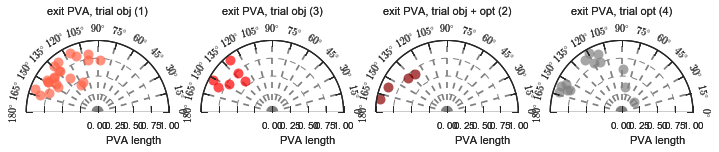

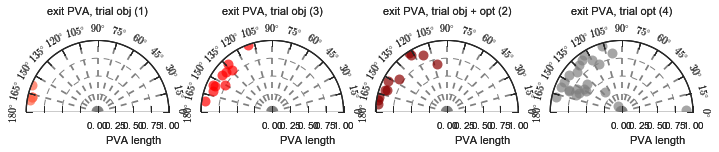

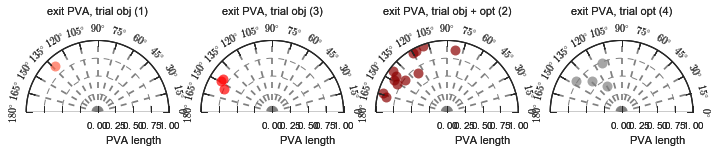

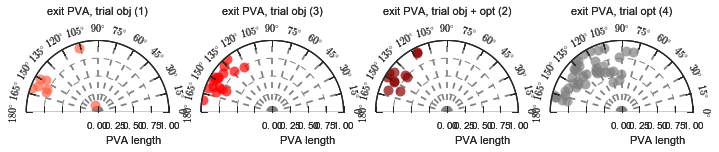

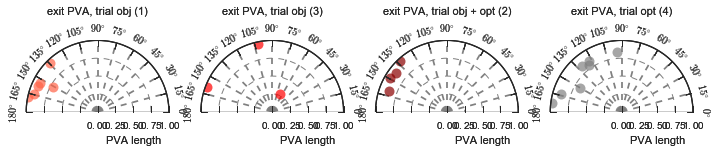

...

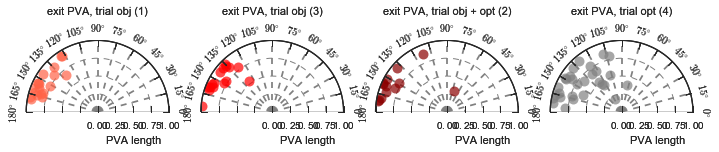

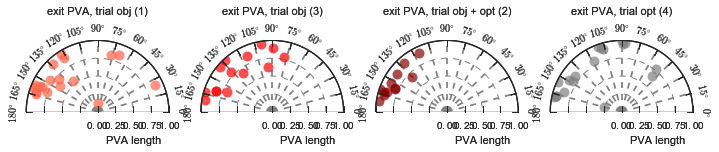

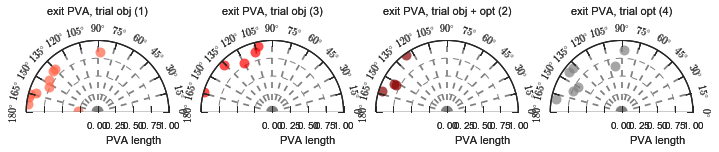

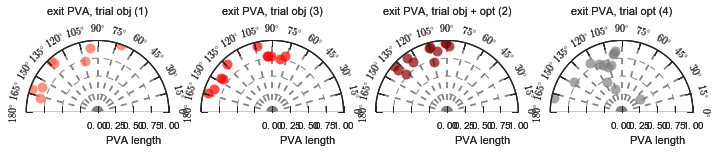

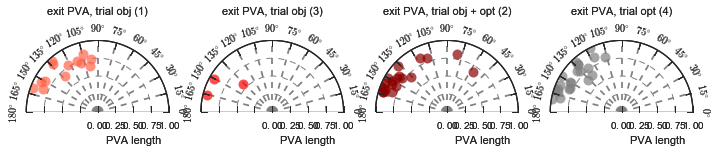

In [82]:
#visit radius and time windows defined above....

angleLow = 0
angleHigh = np.pi

entryPVA = np.zeros((numFlies,4))
entryPVAlength = np.zeros((numFlies,4))

exitPVA = np.zeros((numFlies,4))
exitPVAlength = np.zeros((numFlies,4))

from scipy.stats import circmean as circmean
#from scipy.stats import circvar as circvar

trialCols = ['tomato','red','darkred','grey']

for fly in range(len(flyIDs)):
    
    allPVAFig = plt.figure(figsize=(12,5))
    
    for tind,trial in enumerate([1,2,3,4]):

        querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values

        perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)

        entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

        entrypts = [i for i, x in enumerate(entries) if x]
        exitpts = [i for i, x in enumerate(exits) if x]
        
        entryFragmPVA = np.nan*np.ones((len(entrypts)))
        entryFragmPVAlen = np.nan*np.ones((len(entrypts)))
        exitFragmPVA = np.nan*np.ones((len(exitpts)))
        exitFragmPVAlen = np.nan*np.ones((len(exitpts)))
        
        #entries
        for ind, entry in enumerate(entrypts[:-1]):
            entryFgm = abs(perFlyG[entry+preWindow:entry+postWindow])
            meandir, meanlen = circmeanvec(entryFgm[~np.isnan(entryFgm)], np.ones(len(entryFgm[~np.isnan(entryFgm)])), high=angleHigh, low=angleLow)
            entryFragmPVA[ind] = meandir
            entryFragmPVAlen[ind] = meanlen

        #exits
        for ind, exit in enumerate(exitpts[:-1]):
            exitFgm = abs(perFlyG[exit+preWindow:exit+postWindow])
            meandir, meanlen = circmeanvec(exitFgm[~np.isnan(exitFgm)], np.ones(len(exitFgm[~np.isnan(exitFgm)])), high=angleHigh, low=angleLow)
            exitFragmPVA[ind] = meandir
            exitFragmPVAlen[ind] = meanlen
            
        polplt = fractional_polar_axes(allPVAFig, thlim=(0, 180), rlim=(0, 1+int(np.nanmax(entryPVAlength))), step=(20, 0.2),
                              thlabel = 'exit PVA, trial ' + trialName[tind], rlabel='PVA length',
                                       subplotloc='1'+'4'+str(tind+1))
        polplt.plot(exitFragmPVA*(180.0/np.pi),exitFragmPVAlen,'o', color=trialCols[tind],alpha=0.7, markersize=10)

        meandir, meanlen = circmeanvec(entryFragmPVA[~np.isnan(entryFragmPVA)], entryFragmPVAlen[~np.isnan(entryFragmPVAlen)],
                                       high=angleHigh, low=angleLow)
        entryPVA[fly,tind] = meandir
        entryPVAlength[fly,tind] = meanlen
        
        meandir, meanlen = circmeanvec(exitFragmPVA[~np.isnan(exitFragmPVA)], exitFragmPVAlen[~np.isnan(exitFragmPVAlen)],
                                       high=angleHigh, low=angleLow)
        exitPVA[fly,tind] = meandir
        exitPVAlength[fly,tind] = meanlen

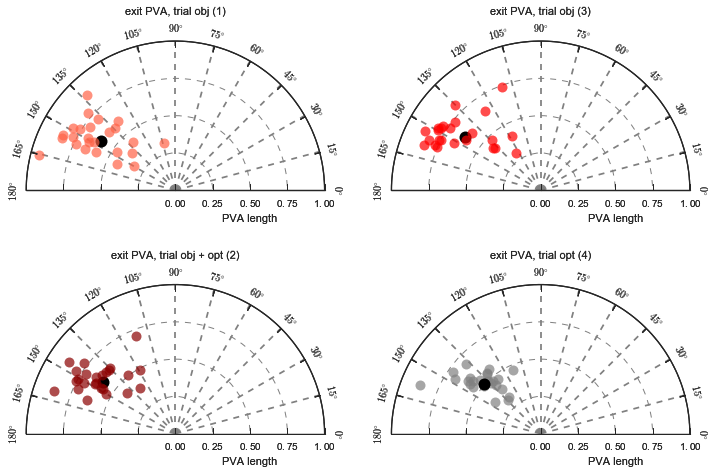

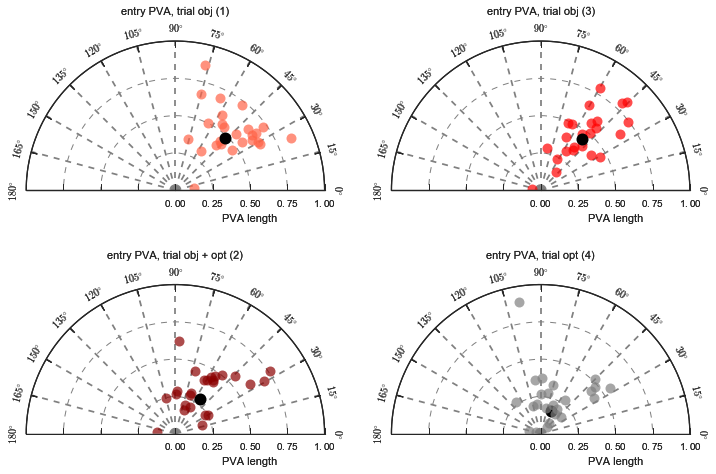

In [83]:
trialCols = ['tomato','red','darkred','grey']

#exits
PVAFig = plt.figure(figsize=(12,8))
for trial in range(4):
    polplt = fractional_polar_axes(PVAFig, thlim=(0, 180), rlim=(0,1), step=(20, 0.2),
                                  thlabel = 'exit PVA, trial ' + trialName[trial], rlabel='PVA length',subplotloc='2'+'2'+str(trial+1))
    theta = exitPVA[:,trial]*(180.0/np.pi)
    polplt.plot(theta,exitPVAlength[:,trial],'o', color=trialCols[trial],alpha=0.7, markersize=10)

    meandir, meanlen = circmeanvec(exitPVA[~np.isnan(exitPVA[:,trial]),trial], exitPVAlength[~np.isnan(exitPVA[:,trial]),trial], high=angleHigh, low=angleLow)
    polplt.plot(meandir*(180.0/np.pi),meanlen,'o', color='black',alpha=1, markersize=12)
    
PVAFig.savefig(analysisDir + 'borderZone/'  + genotype
               + '_exitPVA_n'+ str(numFlies) +'.pdf', format='pdf') 

np.savetxt(analysisDir + 'borderZone/'  + genotype + '_exitPVA_dir_n'+ str(numFlies) +'.csv',\
           exitPVA, delimiter=',')
np.savetxt(analysisDir + 'borderZone/'  + genotype + '_exitPVA_len_n'+ str(numFlies) +'.csv',\
           exitPVAlength, delimiter=',')

#entries
PVAFig = plt.figure(figsize=(12,8))

for trial in range(4):
    polplt = fractional_polar_axes(PVAFig, thlim=(0, 180), rlim=(0, 1), step=(20, 0.2),
                                  thlabel = 'entry PVA, trial ' + trialName[trial], rlabel='PVA length',subplotloc='2'+'2'+str(trial+1))
    polplt.plot(entryPVA[:,trial]*(180.0/np.pi),entryPVAlength[:,trial],'o', color=trialCols[trial],alpha=0.7, markersize=10)
    
    meandir, meanlen = circmeanvec(entryPVA[~np.isnan(entryPVA[:,trial]),trial],entryPVAlength[~np.isnan(entryPVA[:,trial]),trial], high=angleHigh, low=angleLow)
    polplt.plot(meandir*(180.0/np.pi),meanlen,'o', color='black',alpha=1, markersize=12)
    
PVAFig.savefig(analysisDir + 'borderZone/'  + genotype
               + '_entryPVA_n'+ str(numFlies) +'.pdf', format='pdf') 


np.savetxt(analysisDir + 'borderZone/'  + genotype + '_entryPVA_dir_n'+ str(numFlies) +'.csv',\
           entryPVA, delimiter=',')
np.savetxt(analysisDir + 'borderZone/'  + genotype + '_entryPVA_len_n'+ str(numFlies) +'.csv',\
           entryPVAlength, delimiter=',')

In [84]:
stats.ttest_ind(exitPVAlength[:,2],exitPVAlength[:,3], nan_policy = 'omit')

Ttest_indResult(statistic=3.2438284504368093, pvalue=0.0021739903491123798)

In [85]:
stats.ttest_ind(exitPVA[:,2],exitPVA[:,3], nan_policy = 'omit')

Ttest_indResult(statistic=2.0047730016280099, pvalue=0.050766678159443364)

In [86]:
stats.ttest_ind(entryPVAlength[:,2],entryPVAlength[:,3], nan_policy = 'omit')

Ttest_indResult(statistic=1.664923451672448, pvalue=0.1025814224509719)

In [87]:
stats.ttest_ind(entryPVA[:,2],entryPVA[:,3], nan_policy = 'omit')

Ttest_indResult(statistic=-1.3168260909471565, pvalue=0.1942818102544763)

In [1]:
from scipy import stats
import numpy as np

In [7]:
csv = np.genfromtxt ('/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/twoObjOpto/HC_x_10xChrimsonR/baseline10/antiCyli/male/analysis/visitAnalysis/10xChrR-HC-Ret_m_visitFrequency_prePost_visitRad15mm_n25.csv', delimiter=",")
previs = csv[:,0]
postvis = csv[:,1]

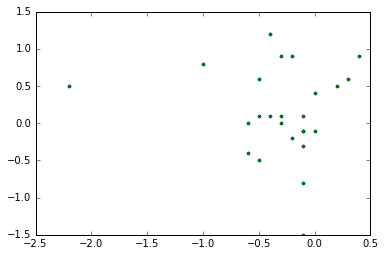

In [10]:
import matplotlib.pyplot as plt
plt.plot(previs, postvis,'.')
plt.show()

In [11]:
stats.ttest_ind(previs, postvis, nan_policy = 'omit')

Ttest_indResult(statistic=-2.903368153660522, pvalue=0.0055631401176258746)

#### Plot median exit and entry trajectory

/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:32: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:33: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


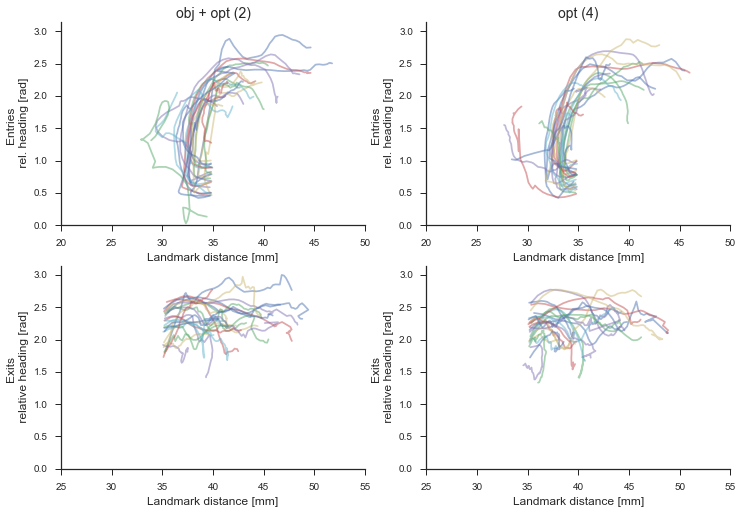

In [177]:
# all flies

avTraj = plt.figure(figsize=(12,8))

for tind,trial in enumerate([3,4]):
    
    for fly in range(len(flyIDs)):
        
        entryPlt = avTraj.add_subplot(2,2,1+tind)
        exitPlt = avTraj.add_subplot(2,2,3+tind)

        querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values

        perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
        
        entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

        entrypts = [i for i, x in enumerate(entries) if x]
        exitpts = [i for i, x in enumerate(exits) if x]
        timevec = np.array(range(int(windowSize)))

        entryFragms = np.nan*np.ones((2,len(entrypts),windowSize))
        exitFragms = np.nan*np.ones((2,len(exitpts),windowSize))
        timeVecEntry = np.nan*np.ones((len(entrypts),windowSize))
        timeVecExit = np.nan*np.ones((len(exitpts),windowSize))
        
        #entries
        for ind, entry in enumerate(entrypts[:-1]):
            entryFragms[0,ind,:] = abs(perFlyG[entry+preWindow:entry+postWindow])
            entryFragms[1,ind,:] = perFlyObjDist[entry+preWindow:entry+postWindow]
            timeVecEntry[ind,:] = timevec
            
            #entryPlt.plot(entryFragms[1,ind,:],entryFragms[0,ind,:],'-', alpha=0.2)
        
        #exits
        for ind, exit in enumerate(exitpts[:-1]):
            exitFragms[0,ind,:] = abs(perFlyG[exit+preWindow:exit+postWindow])
            exitFragms[1,ind,:] = perFlyObjDist[exit+preWindow:exit+postWindow]
            timeVecExit[ind,:] = timevec
            
            #exitPlt.plot(exitFragms[1,ind,:], exitFragms[0,ind,:],'-', alpha=0.2)
        
        entryPlt.plot(np.nanmean(entryFragms[1,:,:],0),
                      np.nanmean(entryFragms[0,:,:],0),'-', alpha=0.5)
        
        exitPlt.plot(np.nanmean(exitFragms[1,:,:],0),
                     np.nanmean(exitFragms[0,:,:],0),'-', alpha=0.5)
    
    entryPlt.set_xlabel('Landmark distance [mm]', fontsize=12)
    entryPlt.set_ylabel('Entries \n rel. heading [rad]',fontsize=12)
    entryPlt.set_title(trialName[trial-1],fontsize=14)
    entryPlt.set_xlim(20,50)
    entryPlt.set_ylim(0,np.pi)
    myAxisTheme(entryPlt)
    
    exitPlt.set_xlabel('Landmark distance [mm]', fontsize=12)
    exitPlt.set_ylabel('Exits \n relative heading [rad]', fontsize=12)
    exitPlt.set_xlim(25,55)
    exitPlt.set_ylim(0,np.pi)
    myAxisTheme(exitPlt)
        

/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:33: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:34: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:46: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:47: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/hannah/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


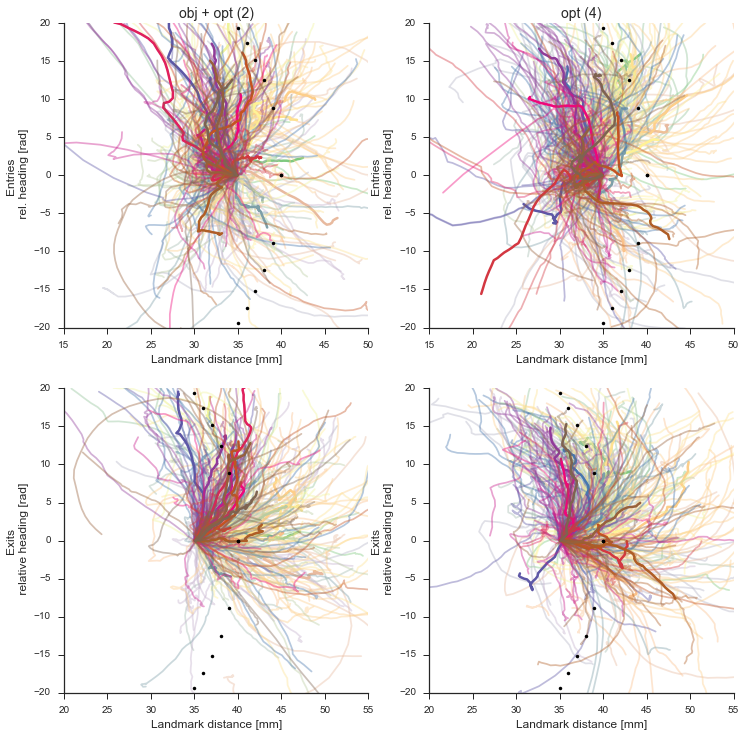

In [265]:
# all flies

avTraj = plt.figure(figsize=(12,12))

for tind,trial in enumerate([3,4]):
    
    for fly in range(len(flyIDs)):
        
        entryPlt = avTraj.add_subplot(2,2,1+tind)
        exitPlt = avTraj.add_subplot(2,2,3+tind)

        querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
        perFlyA = FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1].squeeze().astype('float').values

        perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
        
        entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

        entrypts = [i for i, x in enumerate(entries) if x]
        exitpts = [i for i, x in enumerate(exits) if x]
        timevec = np.array(range(int(windowSize)))

        entryFragms = np.nan*np.ones((2,len(entrypts),windowSize))
        exitFragms = np.nan*np.ones((2,len(exitpts),windowSize))
        timeVecEntry = np.nan*np.ones((len(entrypts),windowSize))
        timeVecExit = np.nan*np.ones((len(exitpts),windowSize))
        
        #entries
        for ind, entry in enumerate(entrypts[:-1]):
            rotAng = 2*np.pi - perFlyTheta[entry] + np.pi
            x = perFlyX[entry+preWindow:entry+postWindow]#-perFlyX[entry]
            y = perFlyY[entry+preWindow:entry+postWindow]#-perFlyY[entry]
            entryFragms[0,ind,:] = x*np.cos(rotAng) - y*np.sin(rotAng)
            entryFragms[1,ind,:] = y*np.cos(rotAng) + x*np.sin(rotAng)
            timeVecEntry[ind,:] = timevec
            
            entryPlt.plot(entryFragms[0,ind,:],entryFragms[1,ind,:],'-',color=flyCMap.to_rgba(fly), alpha=0.4)
            #entryPlt.scatter(entryFragms[0,ind,:],entryFragms[1,ind,:],c = perFlyTheta[entry+preWindow:entry+postWindow], cmap='hsv', 
            #                 vmin=0, vmax=np.pi*2)
        
        #exits
        for ind, exit in enumerate(exitpts[:-1]):
            rotAng = 2*np.pi - perFlyTheta[exit] + np.pi
            x = perFlyX[exit+preWindow:exit+postWindow]#-perFlyX[exit]
            y = perFlyY[exit+preWindow:exit+postWindow]#-perFlyY[exit]
            exitFragms[0,ind,:] = x*np.cos(rotAng) - y*np.sin(rotAng)
            exitFragms[1,ind,:] = y*np.cos(rotAng) + x*np.sin(rotAng)
            timeVecExit[ind,:] = timevec
            
            exitPlt.plot(exitFragms[0,ind,:],exitFragms[1,ind,:],'-',color=flyCMap.to_rgba(fly), alpha=0.4)
        
        entryPlt.plot(np.nanmedian(entryFragms[0,:,:],0),
                      np.nanmedian(entryFragms[1,:,:],0),'-',color=flyCMap.to_rgba(fly), linewidth=2.5, alpha=1)
        
        exitPlt.plot(np.nanmedian(exitFragms[0,:,:],0),
                     np.nanmedian(exitFragms[1,:,:],0),'-',color=flyCMap.to_rgba(fly),linewidth=2.5, alpha=1)
        
    rzx = np.arange(20,rZone_rOuter+5,1)
    entryPlt.plot(rzx, np.sqrt(np.square(rZone_rOuter) - np.square(rzx)),'k.')
    entryPlt.plot(rzx, -np.sqrt(np.square(rZone_rOuter) - np.square(rzx)),'k.')
    entryPlt.set_xlabel('Landmark distance [mm]', fontsize=12)
    entryPlt.set_ylabel('Entries \n rel. heading [rad]',fontsize=12)
    entryPlt.set_title(trialName[trial-1],fontsize=14)
    entryPlt.set_xlim(15,50)
    entryPlt.set_ylim(-20,20)
    myAxisTheme(entryPlt)
    
    exitPlt.plot(rzx, np.sqrt(np.square(rZone_rOuter) - np.square(rzx)),'k.')
    exitPlt.plot(rzx, -np.sqrt(np.square(rZone_rOuter) - np.square(rzx)),'k.')
    exitPlt.set_xlabel('Landmark distance [mm]', fontsize=12)
    exitPlt.set_ylabel('Exits \n relative heading [rad]', fontsize=12)
    exitPlt.set_xlim(20,55)
    exitPlt.set_ylim(-20,20)
    myAxisTheme(exitPlt)
        
avTraj.savefig(analysisDir + 'borderZone/'  + genotype
               + '_avTraj_n'+ str(numFlies) +'.pdf', format='pdf') 

fly: m10


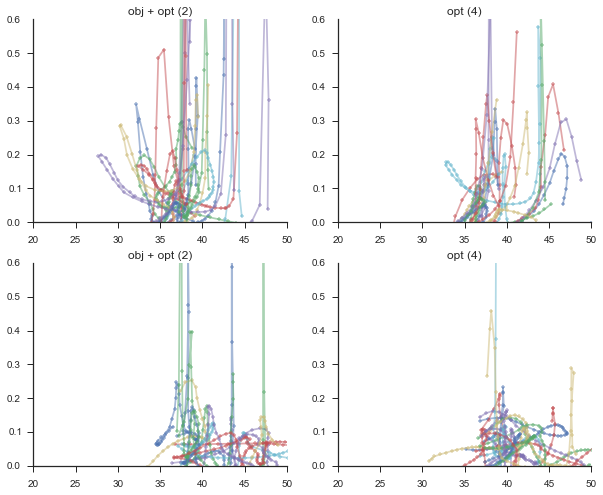

In [57]:
from scipy.interpolate import UnivariateSpline
import numpy as np

def curvature_splines(x, y=None, error=0.1):
    """Calculate the signed curvature of a 2D curve at each point
    using interpolating splines.
    Parameters
    ----------
    x,y: numpy.array(dtype=float) shape (n_points, )
         or
         y=None and
         x is a numpy.array(dtype=complex) shape (n_points, )
         In the second case the curve is represented as a np.array
         of complex numbers.
    error : float
        The admisible error when interpolating the splines
    Returns
    -------
    curvature: numpy.array shape (n_points, )
    Note: This is 2-3x slower (1.8 ms for 2000 points) than `curvature_gradient`
    but more accurate, especially at the borders.
    """

    # handle list of complex case
    if y is None:
        x, y = x.real, x.imag

    t = np.arange(x.shape[0])
    std = error * np.ones_like(x)

    fx = UnivariateSpline(t, x, k=4, w=1 / np.sqrt(std))
    fy = UnivariateSpline(t, y, k=4, w=1 / np.sqrt(std))

    dx = fx.derivative(1)(t)
    ddx = fx.derivative(2)(t)
    dy = fy.derivative(1)(t)
    ddy = fy.derivative(2)(t)
    curvature = (dx* ddy - dy* ddx) / np.power(dx** 2 + dy** 2, 3 / 2)
    return curvature



fly = 9

borderFig, splts = plt.subplots(2, 2, figsize=(10,8))

print('fly: '+flyIDs[fly])

import matplotlib.patches as ptchs

for tind,trial in enumerate([3,4]):
    polfragm = splts[0,tind]
    polfragm2 = splts[1,tind]
    
    querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
    perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
    perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
    perFlyH = FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1].squeeze().astype('float').values
    perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
    perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values
        
    perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
    perFlyObjDist_d = np.hstack((0,np.diff(perFlyObjDist)))
    
    polarCurv, d_theta, dtheta_objDist = polarCurvature(perFlyTheta, perFlyObjDist)
        
    visitRad = rZone_rOuter-2
    entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)
    
    
    entrypts = [i for i, x in enumerate(entries) if x]
    exitpts = [i for i, x in enumerate(exits) if x]

    preWindow = 20*(-0.1)
    postWindow = 20*2
    curverror = 0.5

    for entry in entrypts:
        curv = curvature_splines(x=perFlyX[entry+preWindow:entry+postWindow], y=perFlyY[entry+preWindow:entry+postWindow], error=curverror)
        polfragm.plot(perFlyObjDist[entry+preWindow:entry+postWindow],curv,'.-',alpha=0.5)
        polfragm.set_xlim(20,rZone_rOuter+10)
        polfragm.set_ylim(0,0.6)
        polfragm.set_title(trialName[trial-1])
        myAxisTheme(polfragm)


    for exit in exitpts:
        curv = curvature_splines(x=perFlyX[exit+preWindow:exit+postWindow], y=perFlyY[exit+preWindow:exit+postWindow], error=curverror)
        polfragm2.plot(perFlyObjDist[exit+preWindow:exit+postWindow],curv,'.-',alpha=0.5)
        polfragm2.set_xlim(20,rZone_rOuter+10)
        polfragm2.set_ylim(0,0.6)
        polfragm2.set_title(trialName[trial-1])
        myAxisTheme(polfragm2)
    

### Clustering of trajectory fragments

In [97]:
preWindow = 20*(-0.5)
postWindow = 20*2.5
windowSize = abs(preWindow)+postWindow

#trajExit = np.zeros((1,2,(preWindow+postWindow)*2) # numFlies, numTrials, 2*windowsize
trajExit = np.zeros((1,windowSize*2))

trialID = np.zeros((1))
                    
for tind,trial in enumerate([3,4]):
    for fly in range(numFlies):
        querystring = '(moving > 0) & (flyID=="'+flyIDs[fly]+'") & (trial=='+str(trial)+')'
        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
        perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

        perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)

        visitRad = rZone_rOuter-2
        entries, exits, visitT,entryTime,exitTime = countvisits(perFlyObjDist,visitRad)

        exitpts = [i for i, x in enumerate(exits) if x]

        for exit in exitpts[:-1]:
            trialID  = np.vstack((trialID,trial))
            trajExit = np.vstack((trajExit,
                                  np.hstack((perFlyObjDist[exit+preWindow:exit+postWindow],abs(perFlyG[exit+preWindow:exit+postWindow])))))

        #print('fly: '+flyIDs[fly])

trialID = trialID[1:]
trajExit = trajExit[1:,:]

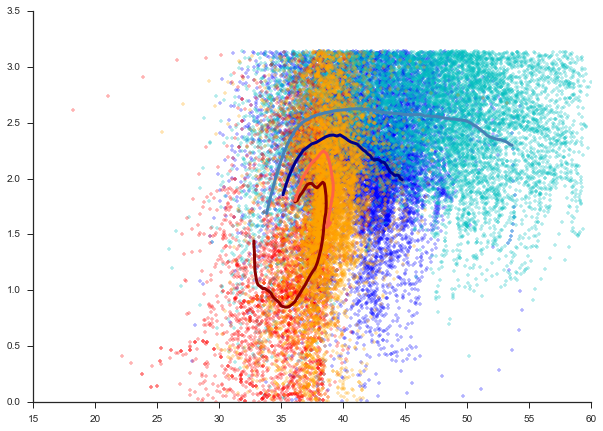

In [103]:
from scipy.cluster.vq import kmeans,vq

numCluster = 4

centroids,_ = kmeans(trajExit,numCluster)
idx,_ = vq(trajExit,centroids)

trajCols = ['b','c','r','orange']
centroidCols = ['darkblue','steelblue','darkred','tomato']
clusterFig = plt.figure(figsize=(10,7))
clusterplt = clusterFig.add_subplot(1,1,1)
for clust in range(numCluster):
    clusterplt.plot(trajExit[idx==clust,:windowSize],trajExit[idx==clust,windowSize:],'.', color=trajCols[clust], alpha=0.3)
for clust in range(numCluster):
    clusterplt.plot(centroids[clust,:windowSize],centroids[clust,windowSize:], color = centroidCols[clust], linewidth=3)
myAxisTheme(clusterplt)

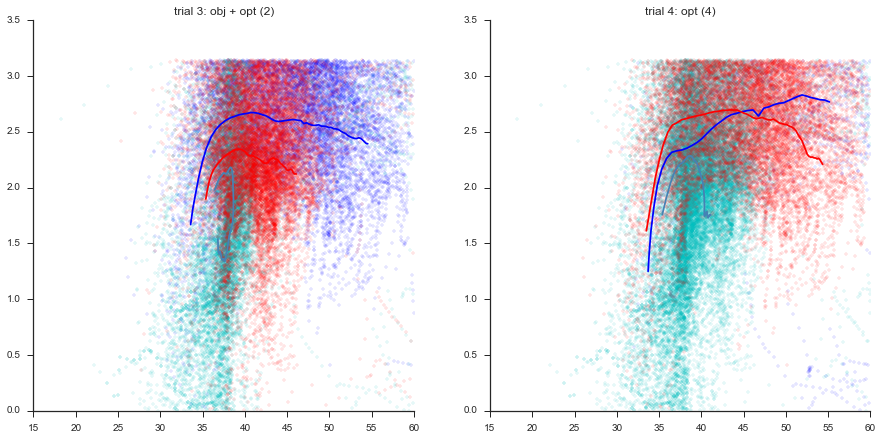

In [102]:
numCluster = 3
centroidCols = ['blue','steelblue','red','tomato','darkred','purple','grey','pink','lightblue']

clusterFig = plt.figure(figsize=(15,7))

trajExit1 = trajExit[:np.sum(trialID==3)]
centroids1,_ = kmeans(trajExit1,numCluster)
idx,_ = vq(trajExit,centroids1)
trial3plt = clusterFig.add_subplot(1,2,1)
for clust in range(numCluster):
    trial3plt.plot(trajExit[idx==clust,:windowSize],trajExit[idx==clust,windowSize:],'.', color=trajCols[clust], alpha=0.1)
for clust in range(numCluster):
    trial3plt.plot(centroids1[clust,:windowSize],centroids1[clust,windowSize:],color=centroidCols[clust])
trial3plt.set_title('trial 3: ' + trialName[2])
myAxisTheme(trial3plt)

trajExit2 = trajExit[np.sum(trialID==3):]
centroids2,_ = kmeans(trajExit2,numCluster)
idx,_ = vq(trajExit,centroids2)
trial4plt = clusterFig.add_subplot(1,2,2)
for clust in range(numCluster):
    trial4plt.plot(trajExit[idx==clust,:windowSize],trajExit[idx==clust,windowSize:],'.', color=trajCols[clust], alpha=0.1)
for clust in range(len(centroids2)):
    trial4plt.plot(centroids2[clust,:windowSize],centroids2[clust,windowSize:],color=centroidCols[clust])
trial4plt.set_title('trial 4: ' + trialName[3],fontsize=12)
myAxisTheme(trial4plt)